# SEA-AD CaH snRNASeq analysis: clustering and annotations

The caudate nucleus (Ca) is a "C"-shaped subcortical structure that pairs with the putamen to form the striatum, a component of the basal ganglia. Beyond its role in motor control, the caudate participates in cognitive processes such as procedural memory and associative learning, and it is implicated in several neurodegenerative diseases, including Parkinson's, Huntington's, and Alzheimer's. In Alzheimer's specifically, the presence of amyloid-$\beta$ plaques in the head of the caudate partly defines Thal stage III. Here we introduce the SEA-AD Caudate Head Atlas, a cellular-resolution view of Alzheimer's disease pathology in the caudate head of human donors.

This dataset comprises ~800,000 single cells from a 42-donor subset of the original 84-donor SEA-AD cohort, selected to minimize comorbidities with other known brain diseases. Disease progression is quantified with a continuous pseudo-progression score (`CPS`), derived from a biophysical model of disease progression fit to quantitative neuropathology from the region. Standard staging measures are also included: overall AD neuropathologic change (`ADNC`), `Braak`, and `Thal`. To annotate the data, we integrated two references — the Human and Mammalian Brain Atlas (HMBA) of the basal ganglia and the SEA-AD middle temporal gyrus (MTG) atlas — merging overlapping classes into the SEA-AD taxonomy. Quality control was performed after integration: for each cluster, thresholds were set on standard metrics including `Genes Detected`, `Doublet score`, and `Fraction mitochondrial UMIs`.

The notebook presented here demonstrates how to access and visualize taxonomy annotations, cell type metadata, donor information, and AD-associated cellular changes from the SEA-AD CaH dataset. These examples focus on precomputed metadata accessible through the Allen Brain Cell Atlas Access package. Additional data, including links to raw sequencing, spatial transcriptomic, and neuropathology data, are available at [SEA-AD.org](https://brain-map.org/consortia/sea-ad).

In [1]:
%matplotlib inline

import pandas as pd
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache

We will interact with the data using the **AbcProjectCache**. This cache object downloads data requested by the user, tracks which files have already been downloaded to your local system, and serves the path to the requested data on disk. For metadata, the cache can also directly serve up a Pandas DataFrame. See the [``getting_started``](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing it if it has not already been.

**Change the download_base variable to where you would like to download the data in your system or a location where a cache is already available.**

In [2]:
download_base = Path('../../data/allen-brain-cell-atlas-staging')
abc_cache = AbcProjectCache.from_cache_dir(
    download_base,
    s3_bucket='allen-brain-cell-atlas-staging',
    auth_required=True
)

abc_cache.current_manifest

'releases/20260930/manifest.json'

## Data overview

Below we list the metadata and gene expression files for each of the directories that make up this dataset:
- SEA-AD-CaH-10X
- SEA-AD-CaH-taxonomy

In [3]:
print("SEA-AD-10X: gene expression data (h5ad)\n\t", abc_cache.list_expression_matrix_files(directory='SEA-AD-CaH-10X'))
print("SEA-AD-CaH-10X: metadata (csv)\n\t", abc_cache.list_metadata_files(directory='SEA-AD-CaH-10X'))

SEA-AD-10X: gene expression data (h5ad)
	 ['CaH-10X/log2', 'CaH-10X/raw']
SEA-AD-CaH-10X: metadata (csv)
	 ['cell_metadata', 'disease', 'donor', 'example_gene_expression', 'gene', 'library', 'value_sets']


We will also use metadata from the SEA-AD-CaH-taxonomy directory. Below is the list of available files:

In [4]:
print("SEA-AD-CaH-taxonomy: metadata (csv)\n\t", abc_cache.list_metadata_files(directory='SEA-AD-CaH-taxonomy'))

SEA-AD-CaH-taxonomy: metadata (csv)
	 ['cell_2d_embedding_coordinates', 'cell_to_cluster_membership', 'cluster', 'cluster_annotation_term', 'cluster_annotation_term_set', 'cluster_to_cluster_annotation_membership']


### Cell metadata

Essential cell metadata is stored as a CSV file that we load as a Pandas DataFrame. Each row represents one cell indexed by a *cell label*. The *cell label* is the concatenation of barcode and name of the sample. In this context, the sample is the *barcoded cell sample* that represents a single load into one port of the 10x Chromium. Note that cell barcodes are only unique within a single *barcoded cell sample* and that the same barcode can be reused. Note that cell barcodes are only unique within a single *barcoded cell sample* and that the same barcode can be reused `exp_component_name` is an alternative cell identifier that indexes some of the data hosted at [SEA-AD.org](https://brain-map.org/consortia/sea-ad). 

Each cell is associated with a *library label*, *donor label*, *alignment_job_id*, *feature_matrix_label* and *dataset_label* identifying which data package this cell is part of. This metadata file will be combined with other metadata files that come with this package to add information associated with the donor, UMAP coordinates, taxonomy assignments, and more.

Below, we load the first of the metadata used in this tutorial. This represents the cell metadata for the aligned dataset.

The command we use below both downloads the data if it is not already available in the local cache and loads the data as a Pandas DataFrame. This pattern of loading metadata is repeated throughout the tutorials.

In [5]:
cell = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-10X',
    file_name='cell_metadata'
).set_index('cell_label')
print("Number of cells = ", len(cell))
cell.head()

cell_metadata.csv: 100%|██████████| 161M/161M [00:06<00:00, 26.1MMB/s]   
/Users/chris.morrison/src/abc_atlas_access/src/abc_atlas_access/abc_atlas_cache/abc_project_cache.py:643: DtypeWarning: Columns (0: alignment_job_id) have mixed types. Specify dtype option on import or set low_memory=False.
  return pd.read_csv(path, **kwargs)


Number of cells =  886037


,cell_barcode,barcoded_cell_sample_label,library_label,alignment_job_id,doublet_score,umi_count,Used in analysis,donor_label,exp_component_name,feature_matrix_label,dataset_label
cell_label,,,,,,,,,,,
AAACCCAAGAATCTAG-1336_B04,AAACCCAAGAATCTAG,1336_B04,L8HX_220714_02_B02,1194262311,0.05,64074.0,True,H21.33.004,AAACCCAAGAATCTAG-L8HX_220714_02_B02-1194262311,CaH-10X,SEA-AD-CaH-10X
AAACCCAAGCACAAAT-1336_B04,AAACCCAAGCACAAAT,1336_B04,L8HX_220714_02_B02,1194262311,0.08,37080.0,True,H21.33.004,AAACCCAAGCACAAAT-L8HX_220714_02_B02-1194262311,CaH-10X,SEA-AD-CaH-10X
AAACCCAAGGGACTGT-1336_B04,AAACCCAAGGGACTGT,1336_B04,L8HX_220714_02_B02,1194262311,0.14,7534.0,False,H21.33.004,AAACCCAAGGGACTGT-L8HX_220714_02_B02-1194262311,CaH-10X,SEA-AD-CaH-10X
AAACCCACAATTTCCT-1336_B04,AAACCCACAATTTCCT,1336_B04,L8HX_220714_02_B02,1194262311,0.10,4867.0,True,H21.33.004,AAACCCACAATTTCCT-L8HX_220714_02_B02-1194262311,CaH-10X,SEA-AD-CaH-10X
AAACCCACAGCAATTC-1336_B04,AAACCCACAGCAATTC,1336_B04,L8HX_220714_02_B02,1194262311,0.00,2399.0,True,H21.33.004,AAACCCACAGCAATTC-L8HX_220714_02_B02-1194262311,CaH-10X,SEA-AD-CaH-10X


We can use pandas `groupby` function to see how many unique items are associated for each field and list them out if the number of unique items is small.

In [6]:
def print_column_info(df):
    
    for c in df.columns:
        grouped = df[[c]].groupby(c).count()
        members = ''
        if len(grouped) < 30:
            members = str(list(grouped.index))
        print("Number of unique %s = %d %s" % (c, len(grouped), members))

In [7]:
print_column_info(cell)

Number of unique cell_barcode = 804174 
Number of unique barcoded_cell_sample_label = 64 
Number of unique library_label = 64 
Number of unique alignment_job_id = 66 
Number of unique doublet_score = 876 
Number of unique umi_count = 111595 
Number of unique Used in analysis = 2 [False, True]
Number of unique donor_label = 41 
Number of unique exp_component_name = 886037 
Number of unique feature_matrix_label = 1 ['CaH-10X']
Number of unique dataset_label = 1 ['SEA-AD-CaH-10X']


### Donor, Library, and disease metadata

The first two associated metadata we load are the `donor`, `library`, and `disease` tables. The donor table includes donor demographics such as species, age, sex, race, and education, along with brain tissue metrics such as pH, postmortem interval (PMI), and fresh brain weight. This table also indicates which study a donor was enrolled in (ACT or ADRC). The library table contains information on 10X methods and brain region of interest the tissue was extracted from. The disease table contains disease progression metrics and other pathology data. Definitions of many of these columns can be found [here](https://cdn.prod.website-files.com/689cfbd308fa7373b604d290/6a458356cbaf777f617ae687_sea-ad_donorindex_dataelementbriefdescriptions_063026.pdf).

In [8]:
donor = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-10X',
    file_name='donor'
).set_index('donor_label')

donor.head()

donor.csv: 100%|██████████| 8.69k/8.69k [00:00<00:00, 122kMB/s]


,donor_species,species_scientific_name,species_genus,donor_sex,donor_age,donor_age_value,donor_age_unit,donor_gender,Race (choice=White),Race (choice=Black/ African American),...,Race (choice=Other),Hispanic/Latino,specify other race,Highest level of education,Years of education,PMI,Fresh Brain Weight,Brain pH,Primary Study Name,donor_race
donor_label,,,,,,,,,,,,,,,,,,,,,
H19.33.004,NCBITaxon:9606,Homo sapiens,Human,Female,80 yrs,80,years,Female,Checked,Unchecked,...,Unchecked,No,NaN,Bachelors,17,8.133333,1035.0,7.0,ACT,White
H20.33.001,NCBITaxon:9606,Homo sapiens,Human,Male,82 yrs,82,years,Male,Checked,Unchecked,...,Unchecked,No,NaN,Bachelors,16,7.700000,1338.0,6.8,ACT,White
H20.33.005,NCBITaxon:9606,Homo sapiens,Human,Female,99 yrs,99,years,Female,Checked,Unchecked,...,Unchecked,No,NaN,High School,12,7.600000,1003.0,6.8,ACT,White
H20.33.008,NCBITaxon:9606,Homo sapiens,Human,Female,92 yrs,92,years,Female,Checked,Unchecked,...,Unchecked,No,NaN,Graduate (PhD/Masters),18,7.000000,1105.0,6.4,ACT,White
H20.33.011,NCBITaxon:9606,Homo sapiens,Human,Female,93 yrs,93,years,Female,Checked,Unchecked,...,Unchecked,No,NaN,Bachelors,16,6.000000,1156.0,7.0,ACT,White


Next we load the library metadata. The information we will primarily use from this table are the region of interest that each library is associated with.

In [9]:
library = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-10X',
    file_name='library'
).set_index('library_label')
library.head()

library.csv: 100%|██████████| 7.64k/7.64k [00:00<00:00, 78.2kMB/s]


,library_method,barcoded_cell_sample_label,enrichment_population,cell_specimen_type,parcellation_term_identifier,region_of_interest_label,region_of_interest_name,Brain Region,donor_label
library_label,,,,,,,,,
L8HX_220714_02_B02,10xV3.1_HT,1336_B04,"70% NeuN+, 30% NeuN-",Nuclei,DHBA:10335,CaH,head of caudate,CaH,H21.33.004
L8HX_220519_03_A03,10xV3.1_HT,1257_B01,"70% NeuN+, 30% NeuN-",Nuclei,DHBA:10335,CaH,head of caudate,CaH,H20.33.012
L8HX_220519_03_E02,10xV3.1_HT,1257_A02,"70% NeuN+, 30% NeuN-",Nuclei,DHBA:10335,CaH,head of caudate,CaH,H19.33.004
L8HX_220428_03_C12,10xV3.1_HT,1225_B02,"70% NeuN+, 30% NeuN-",Nuclei,DHBA:10335,CaH,head of caudate,CaH,H21.33.032
L8HX_220407_03_A12,10xV3.1_HT,1190_B01,"50% NeuN+, 50% NeuN-",Nuclei,DHBA:10335,CaH,head of caudate,CaH,H21.33.022


Finally we load the disease data containing disease progression information.

In [10]:
disease = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-10X',
    file_name='disease'
).set_index('donor_label')
disease.head()

disease.csv: 100%|██████████| 8.13k/8.13k [00:00<00:00, 61.2kMB/s]


,Overall AD neuropathological Change,Thal,Braak,CERAD score,Overall CAA Score,Highest Lewy Body Disease,Total Microinfarcts (not observed grossly),Total microinfarcts in screening sections,Atherosclerosis,Arteriolosclerosis,...,Last CASI Score,Interval from last CASI in months,Last MMSE Score,Interval from last MMSE in months,Last MOCA Score,Interval from last MOCA in months,APOE Genotype,CPS,CPS_AT8,CPS_6E10
donor_label,,,,,,,,,,,,,,,,,,,,,
H19.33.004,Not AD,Thal 0,Braak IV,Absent,Not identified,Not Identified (olfactory bulb not assessed),1,1,Mild,Moderate,...,85.0,3.5,25.0,3.5,NaN,NaN,3/3,0.000000,0.000000,0.000000
H20.33.001,Low,Thal 2,Braak IV,Sparse,Not identified,Not Identified (olfactory bulb not assessed),0,0,Mild,Mild,...,97.0,18.2,28.0,18.2,NaN,NaN,3/3,0.577213,0.618921,0.349652
H20.33.005,Intermediate,Thal 3,Braak IV,Moderate,Moderate,Not Identified (olfactory bulb not assessed),2,2,Mild,Moderate,...,94.0,24.2,29.0,24.2,NaN,NaN,2/3,0.702125,0.476388,0.738349
H20.33.008,High,Thal 4,Braak V,Moderate,Moderate,Not Identified (olfactory bulb not assessed),0,0,Moderate,Moderate,...,92.0,2.7,29.0,2.7,NaN,NaN,3/4,0.961588,0.823632,0.913234
H20.33.011,High,Thal 5,Braak V,Moderate,Moderate,Amygdala-predominant,0,0,Moderate,Severe,...,79.0,7.8,21.0,7.8,NaN,NaN,3/4,0.972877,0.820284,0.972102


We combine the donor, library, and disease tables into an extended cell metadata table.

In [11]:
cell_extended = cell.join(donor, on='donor_label')
cell_extended = cell_extended.join(library, on='library_label', rsuffix='_library_table')
cell_extended = cell_extended.join(disease, on='donor_label', rsuffix='_disease')

del cell

We use the `groupby` function to show the number of cells for one of disease data columns. Change this to any other column to get counts by any of the various metadata.

In [12]:
cell_extended.groupby('Thal')[['region_of_interest_label']].count()

,region_of_interest_label
Thal,
Thal 0,70951
Thal 1,104723
Thal 2,109533
Thal 3,116450
Thal 4,273742
Thal 5,210638


We can use the group by functionality to group the cells by cognitive status.

In [13]:
cell_extended.groupby('Cognitive Status')[['library_label']].count().rename(columns={'library_label': 'number_of_cells'})

,number_of_cells
Cognitive Status,
Dementia,399647
No dementia,486390


### Adding color and feature order

Each major feature in the donor and library table is associated with unique colors and an ordering with the set of values. Below we load the `value_sets` DataFrame which is a mapping from the various value in the donor and species tables to those colors and orderings. We incorporate these values into the cell metadata table. 

In [14]:
value_sets = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-10X',
    file_name='value_sets'
).fillna({'label': 'None'}).set_index('label')
value_sets

value_sets.csv: 100%|██████████| 15.6k/15.6k [00:00<00:00, 146kMB/s] 


,field,table,color_hex_triplet,order,description,external_identifier
label,,,,,,
2/2,APOE Genotype,disease,#fdd4c2,1,NaN,NaN
2/3,APOE Genotype,disease,#fca082,2,NaN,NaN
2/4,APOE Genotype,disease,#fb6a4a,3,NaN,NaN
3/3,APOE Genotype,disease,#e32f27,4,NaN,NaN
3/4,APOE Genotype,disease,#b21218,5,NaN,NaN
...,...,...,...,...,...,...
FI,region_of_interest_label,library,#008080,7,agranular frontal insular cortex (area FI),DHBA:10329
STG,region_of_interest_label,library,#006400,8,superior temporal gyrus,DHBA:12140
DFC,region_of_interest_label,library,#00008b,9,dorsolateral prefrontal cortex,DHBA:10173


We define a convenience function to add colors for the various values in the data (e.g. unique region of interest or donor sex values).

In [15]:
def extract_value_set(
        cell_metadata_df: pd.DataFrame,
        input_value_set: pd.DataFrame,
        input_value_set_label: str,
        dataframe_column: Optional[str] = None
    ):
    """Add color and order columns to the cell metadata dataframe based on the input
    value set.

    Columns are added as {input_value_set_label}_color and {input_value_set_label}_order.

    Parameters
    ----------
    cell_metadata_df : pd.DataFrame
        DataFrame containing cell metadata.
    input_value_set : pd.DataFrame
        DataFrame containing the value set information.
    input_value_set_label : str
        The the column name to extract color and order information for. will be added to the cell metadata.
    """
    if dataframe_column is None:
        dataframe_column = input_value_set_label
    cell_metadata_df[f'{dataframe_column}_color'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[dataframe_column]]['color_hex_triplet'].values
    cell_metadata_df[f'{dataframe_column}_order'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[dataframe_column]]['order'].values

Use our function to add the relevant color and order columns to our cell_metadata table.

In [16]:
# Add region of interest color and order
extract_value_set(cell_extended, value_sets, 'region_of_interest_label')
# Add disease color and order
extract_value_set(cell_extended, value_sets, 'APOE Genotype')
extract_value_set(cell_extended, value_sets, 'Arteriolosclerosis')
extract_value_set(cell_extended, value_sets, 'Atherosclerosis')
extract_value_set(cell_extended, value_sets, 'Braak')
extract_value_set(cell_extended, value_sets, 'CERAD score')
extract_value_set(cell_extended, value_sets, 'Cognitive Status')
extract_value_set(cell_extended, value_sets, 'LATE')
extract_value_set(cell_extended, value_sets, 'Highest Lewy Body Disease')
extract_value_set(cell_extended, value_sets, 'Overall AD neuropathological Change')
extract_value_set(cell_extended, value_sets, 'Thal')
# Add donor sex/gender color and order
extract_value_set(cell_extended, value_sets, 'donor_sex')
extract_value_set(cell_extended, value_sets, 'donor_gender')
# Add race
extract_value_set(cell_extended, value_sets, 'donor_race')
cell_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,alignment_job_id,doublet_score,umi_count,Used in analysis,donor_label,exp_component_name,feature_matrix_label,...,Overall AD neuropathological Change_color,Overall AD neuropathological Change_order,Thal_color,Thal_order,donor_sex_color,donor_sex_order,donor_gender_color,donor_gender_order,donor_race_color,donor_race_order
cell_label,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGAATCTAG-1336_B04,AAACCCAAGAATCTAG,1336_B04,L8HX_220714_02_B02,1194262311,0.05,64074.0,True,H21.33.004,AAACCCAAGAATCTAG-L8HX_220714_02_B02-1194262311,CaH-10X,...,#fcbba1,1,#fedbcb,1,#ADC4C3,2,#ADC4C3,2,#f7f184,125
AAACCCAAGCACAAAT-1336_B04,AAACCCAAGCACAAAT,1336_B04,L8HX_220714_02_B02,1194262311,0.08,37080.0,True,H21.33.004,AAACCCAAGCACAAAT-L8HX_220714_02_B02-1194262311,CaH-10X,...,#fcbba1,1,#fedbcb,1,#ADC4C3,2,#ADC4C3,2,#f7f184,125
AAACCCAAGGGACTGT-1336_B04,AAACCCAAGGGACTGT,1336_B04,L8HX_220714_02_B02,1194262311,0.14,7534.0,False,H21.33.004,AAACCCAAGGGACTGT-L8HX_220714_02_B02-1194262311,CaH-10X,...,#fcbba1,1,#fedbcb,1,#ADC4C3,2,#ADC4C3,2,#f7f184,125
AAACCCACAATTTCCT-1336_B04,AAACCCACAATTTCCT,1336_B04,L8HX_220714_02_B02,1194262311,0.10,4867.0,True,H21.33.004,AAACCCACAATTTCCT-L8HX_220714_02_B02-1194262311,CaH-10X,...,#fcbba1,1,#fedbcb,1,#ADC4C3,2,#ADC4C3,2,#f7f184,125
AAACCCACAGCAATTC-1336_B04,AAACCCACAGCAATTC,1336_B04,L8HX_220714_02_B02,1194262311,0.00,2399.0,True,H21.33.004,AAACCCACAGCAATTC-L8HX_220714_02_B02-1194262311,CaH-10X,...,#fcbba1,1,#fedbcb,1,#ADC4C3,2,#ADC4C3,2,#f7f184,125


### UMAP spatial embedding

Now that we've merged our donor and library metadata into the main cells data, our next step is to plot these values in the Uniform Manifold Approximation and Projection (UMAP) for cells in the dataset. The UMAP is a dimension reduction technique that can be used for visualizing and exploring large-dimension datasets. 

Below we load this 2-D embedding for a sub selection of our cells and merge the x-y coordinates into the extended cell metadata we are creating. 

In [17]:
cell_2d_embedding_coordinates = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-taxonomy',
    file_name='cell_2d_embedding_coordinates'
).set_index('cell_label')
cell_2d_embedding_coordinates.head()

cell_2d_embedding_coordinates.csv: 100%|██████████| 41.1M/41.1M [00:02<00:00, 20.2MMB/s]  


,x,y
cell_label,,
AAACCCAAGAATCTAG-1336_B04,13.205919,4.357159
AAACCCAAGCACAAAT-1336_B04,13.403980,2.630821
AAACCCAAGGGACTGT-1336_B04,10.594164,1.961733
AAACCCACAATTTCCT-1336_B04,6.760588,0.988031
AAACCCACAGCAATTC-1336_B04,4.390634,3.214746


In [18]:
cell_extended = cell_extended.join(cell_2d_embedding_coordinates, how='inner')
cell_extended = cell_extended.sample(frac=1) # shuffle the rows for plotting purposes

del cell_2d_embedding_coordinates

We define a small helper function *plot_umap* to visualize the cells on the UMAP. In the examples below we will plot associated cell information colorized by donor age, sex, region of interest etc.

In [19]:
def plot_umap(
    xx: np.ndarray,
    yy: np.ndarray,
    cc: np.ndarray = None,
    val: np.ndarray = None,
    fig_width: float = 8,
    fig_height: float = 8,
    cmap: Optional[plt.Colormap] = None,
    labels: np.ndarray = None,
    term_orders: np.ndarray = None,
    colorbar: bool = False,
    sizes: np.ndarray = None,
    limit_plot: bool = True
 ) -> Tuple[plt.Figure, plt.Axes]:
    """
    Plot a scatter plot of the UMAP coordinates.

    Parameters
    ----------
    xx : array-like
        x-coordinates of the points to plot.
    yy : array-like
        y-coordinates of the points to plot.
    cc : array-like, optional
        colors of the points to plot. If None, the points will be colored by the values in `val`.
    val : array-like, optional
        values of the points to plot. If None, the points will be colored by the values in `cc`.
    fig_width : float, optional
        width of the figure in inches. Default is 8.
    fig_height : float, optional
        height of the figure in inches. Default is 8.
    cmap : str, optional
        colormap to use for coloring the points. If None, the points will be colored by the values in `cc`.
    labels : array-like, optional
        labels for the points to plot. If None, no labels will be added to the plot.
    term_orders : array-like, optional
        order of the labels for the legend. If None, the labels will be ordered by their appearance in `labels`.
    colorbar : bool, optional
        whether to add a colorbar to the plot. Default is False.
    sizes : array-like, optional
        sizes of the points to plot. If None, all points will have the same size.
    """
    if sizes is None:
        sizes = 1
    fig, ax = plt.subplots()
    fig.set_size_inches(fig_width, fig_height)

    if cmap is not None:
        scatt = ax.scatter(xx, yy, c=val, s=0.5, marker='.', cmap=cmap, alpha=sizes)
    elif cc is not None:
        scatt = ax.scatter(xx, yy, c=cc, s=0.5, marker='.', alpha=sizes)

    if labels is not None:
        from matplotlib.patches import Rectangle
        unique_label_colors = (labels + ',' + cc).unique()
        unique_labels = np.array([label_color.split(',')[0] for label_color in unique_label_colors])
        unique_colors = np.array([label_color.split(',')[1] for label_color in unique_label_colors])

        if term_orders is not None:
            unique_order = term_orders.unique()
            term_order = np.argsort(unique_order)
            unique_labels = unique_labels[term_order]
            unique_colors = unique_colors[term_order]
            
        rects = []
        for color in unique_colors:
            rects.append(Rectangle((0, 0), 1, 1, fc=color))

        legend = ax.legend(rects, unique_labels, loc=1)
        # ax.add_artist(legend)

    if colorbar:
        fig.colorbar(scatt, ax=ax)
    
    return fig, ax

Plot the various donor and library metadata available.

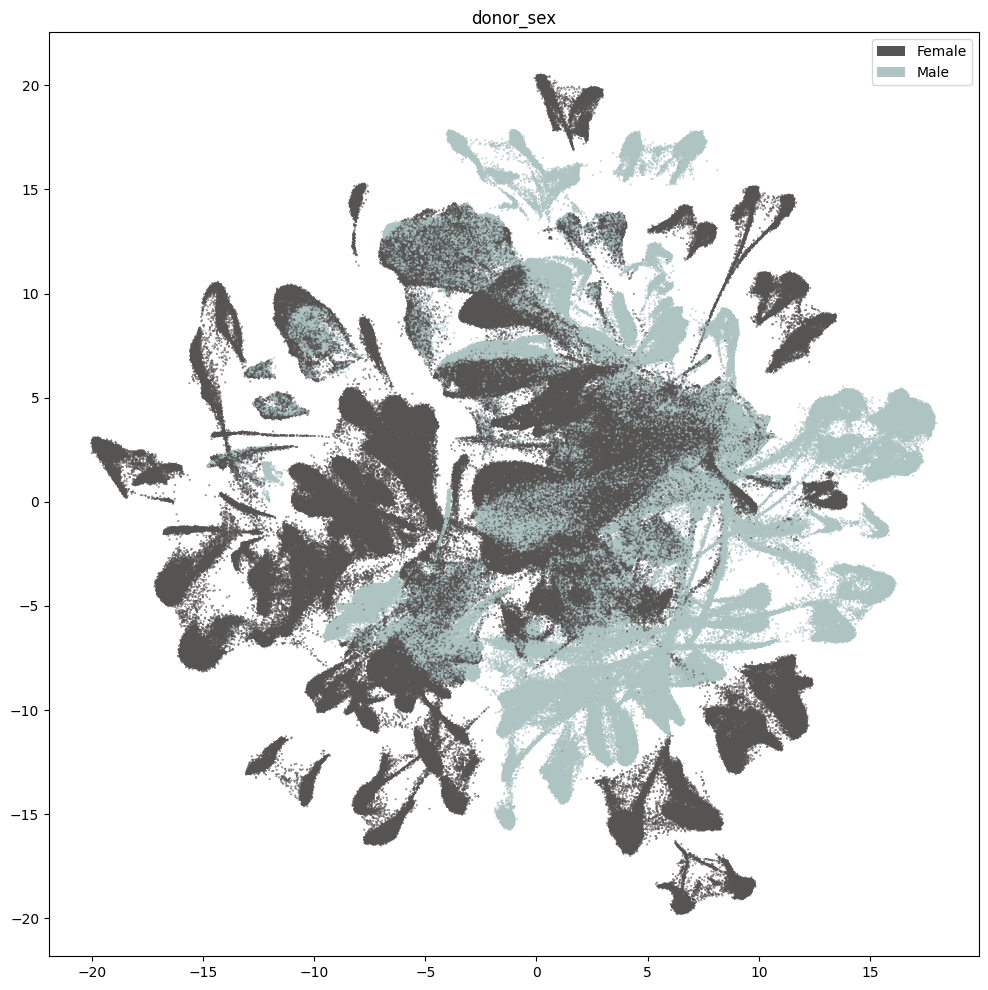

In [20]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['donor_sex_color'],
    labels=cell_extended['donor_sex'],
    term_orders=cell_extended['donor_sex_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("donor_sex")
plt.show()

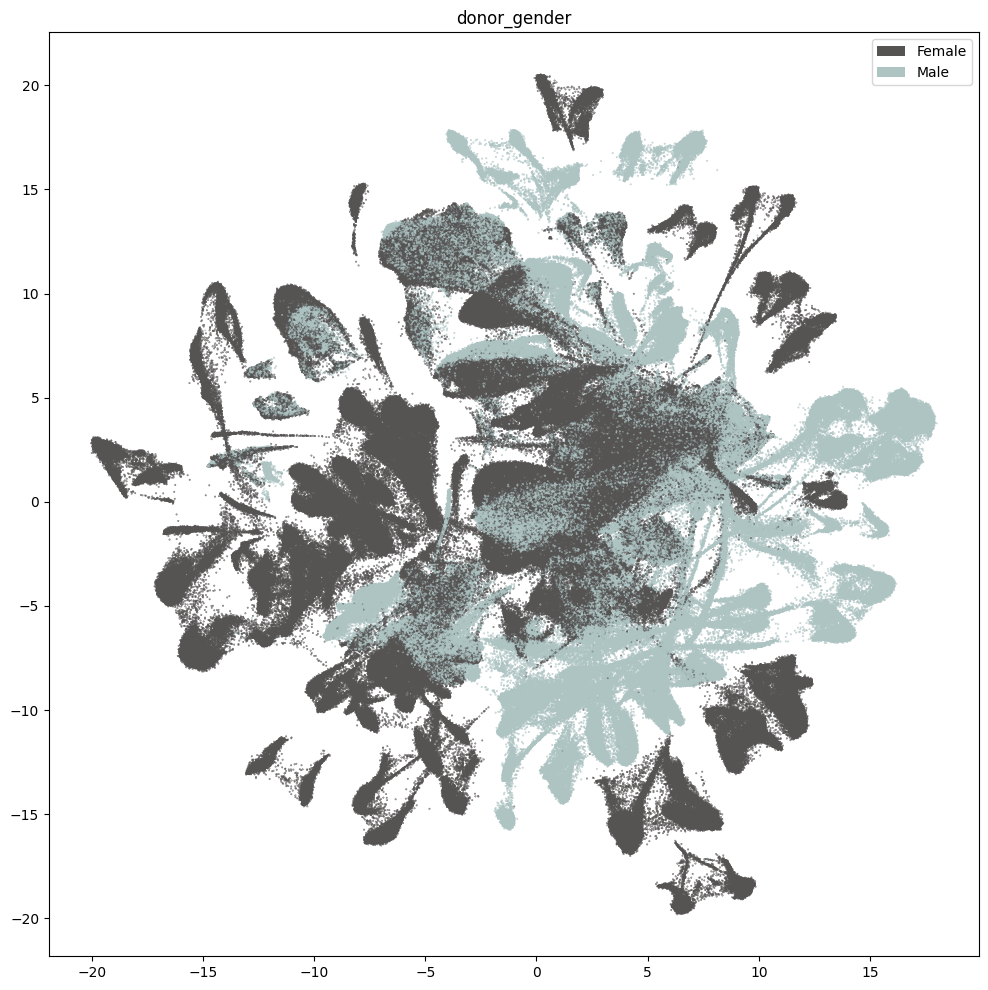

In [21]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['donor_gender_color'],
    labels=cell_extended['donor_gender'],
    term_orders=cell_extended['donor_gender_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("donor_gender")
plt.show()

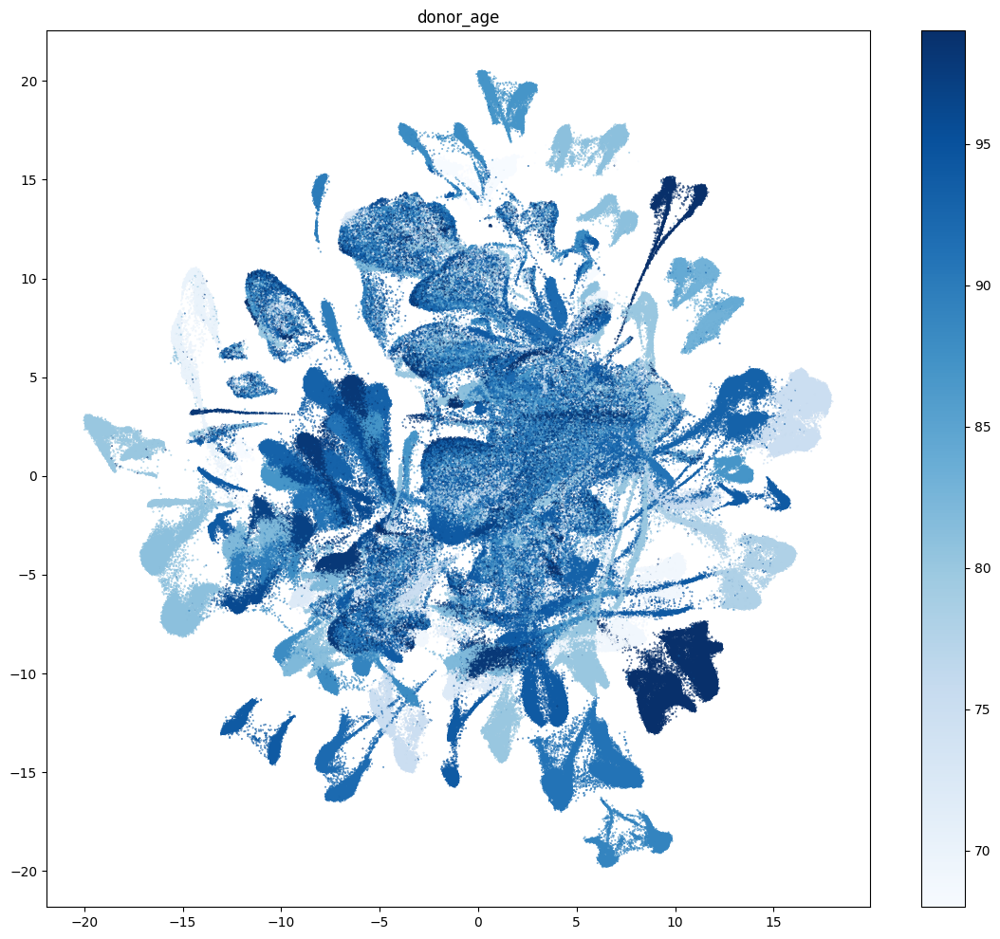

In [22]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    val=cell_extended['donor_age_value'],
    cmap=plt.cm.Blues,
    fig_width=14,
    fig_height=12,
    colorbar=True,
)
res = ax.set_title("donor_age")
plt.show()

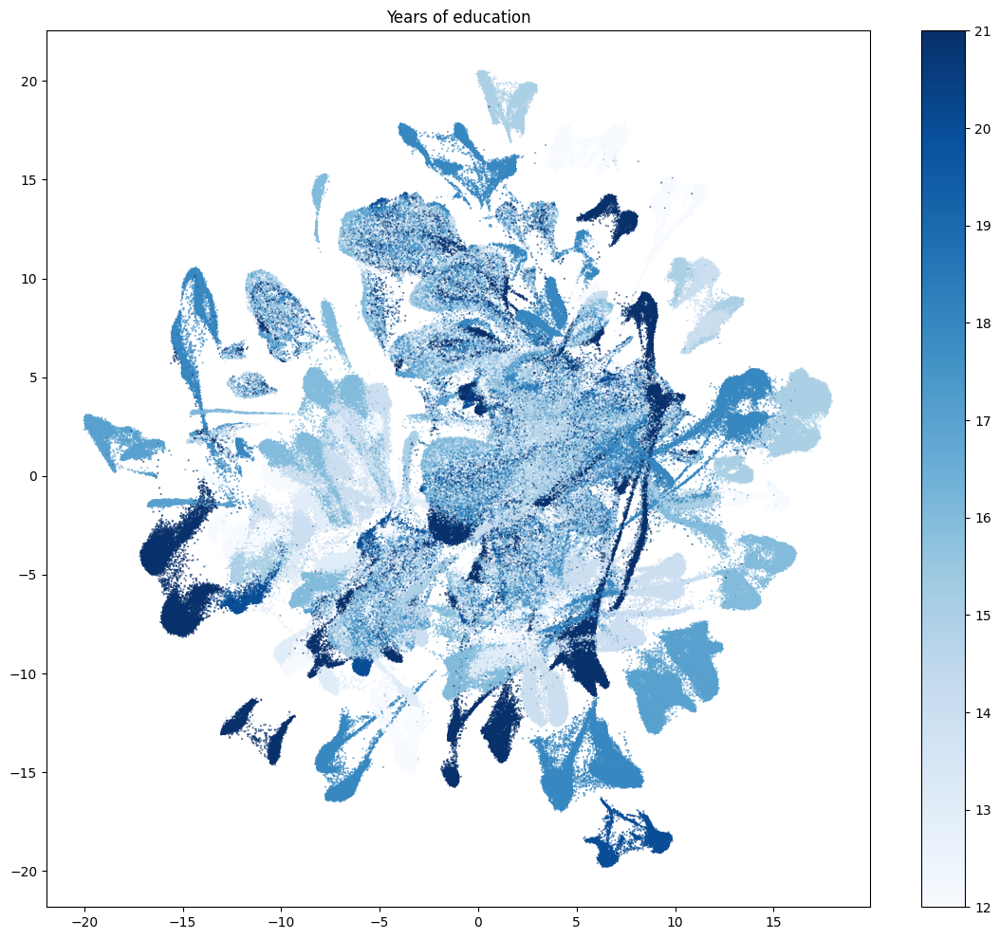

In [23]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    val=cell_extended['Years of education'],
    cmap=plt.cm.Blues,
    fig_width=14,
    fig_height=12,
    colorbar=True,
)
res = ax.set_title("Years of education")
plt.show()

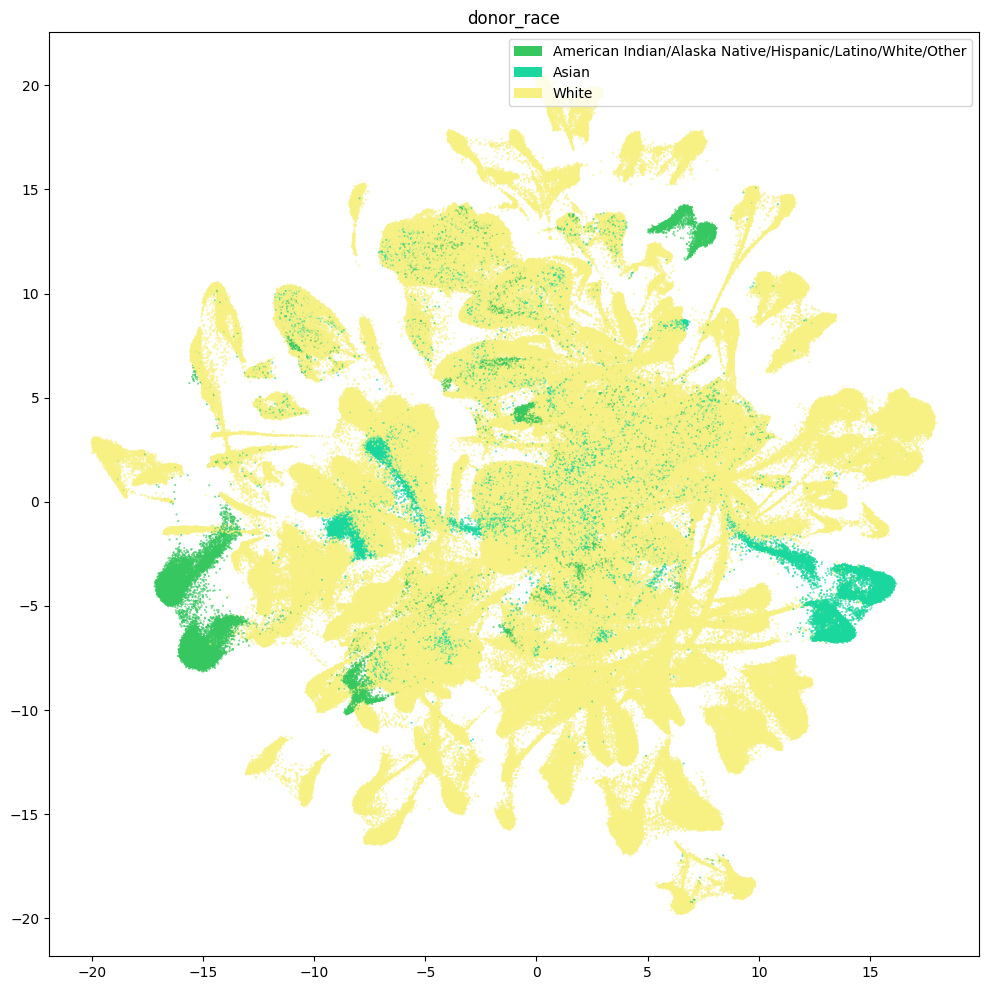

In [24]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['donor_race_color'],
    labels=cell_extended['donor_race'],
    term_orders=cell_extended['donor_race_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("donor_race")
plt.show()

New we plot the UMAP with for the various disease markers in the data.

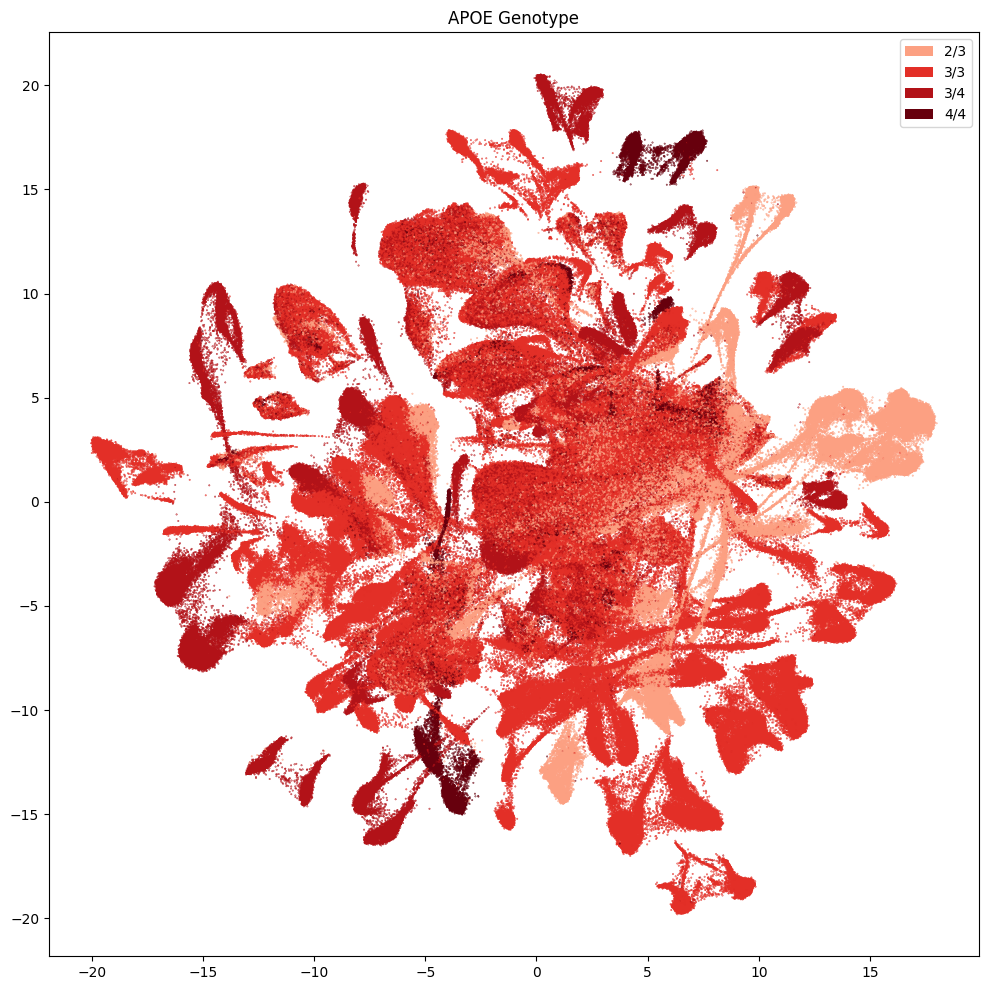

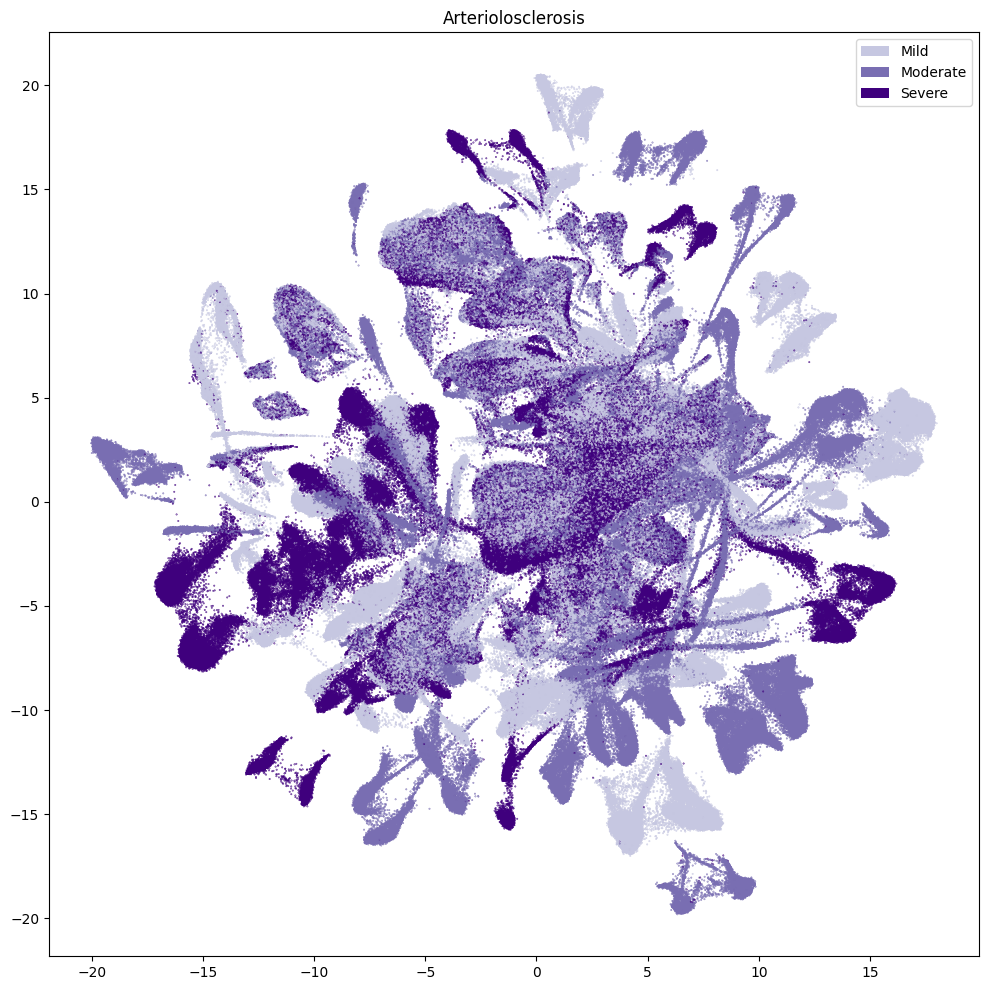

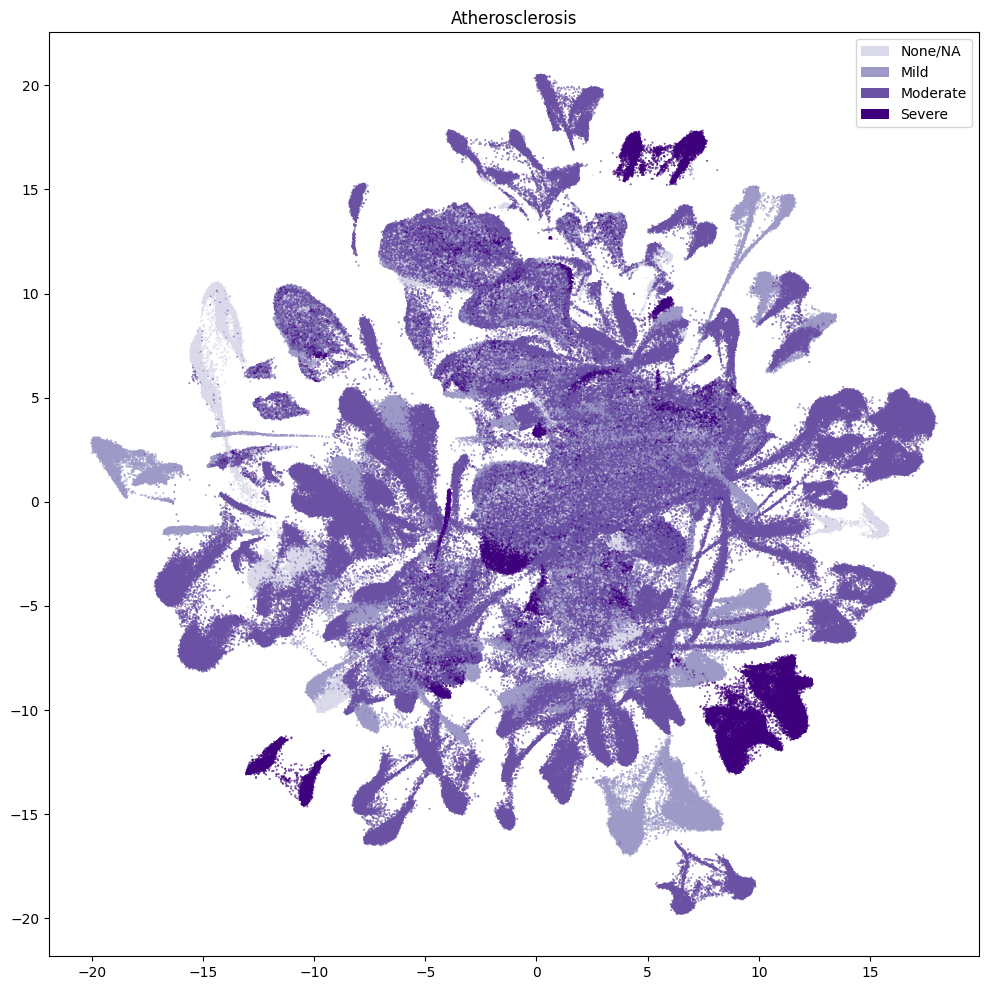

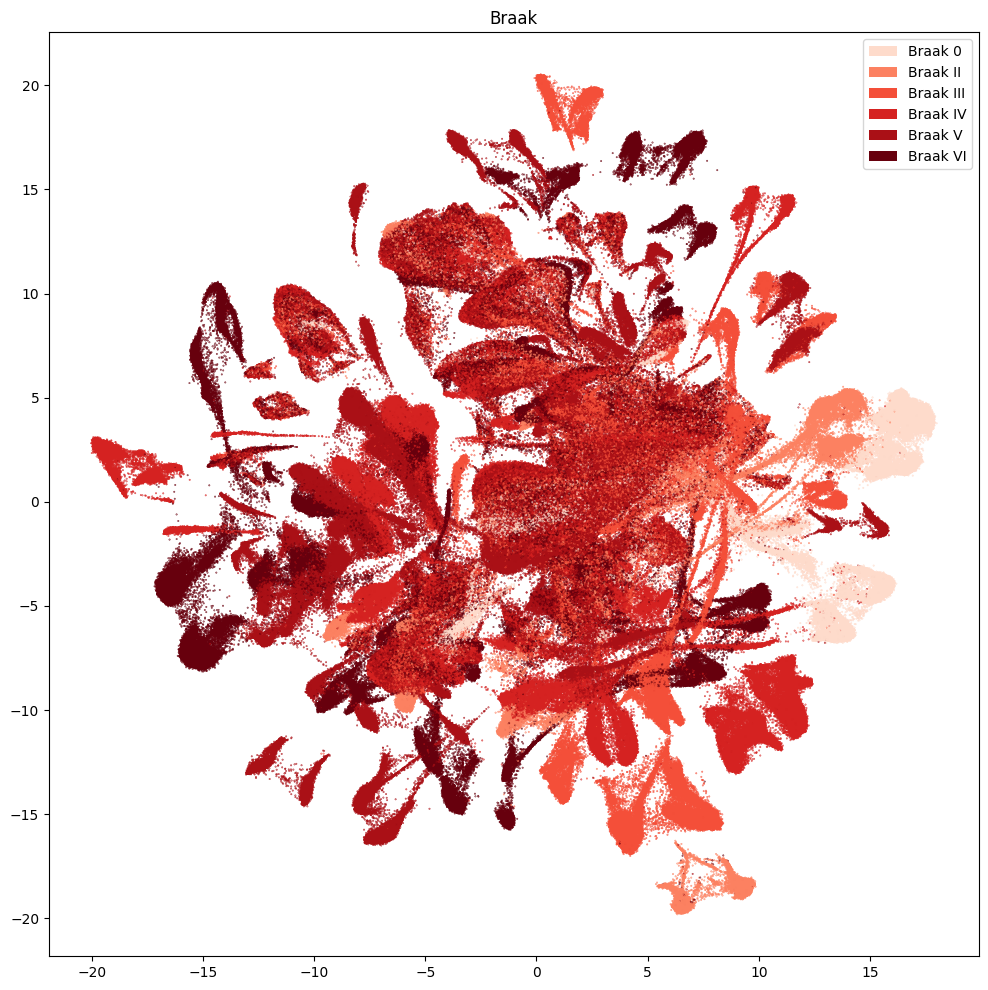

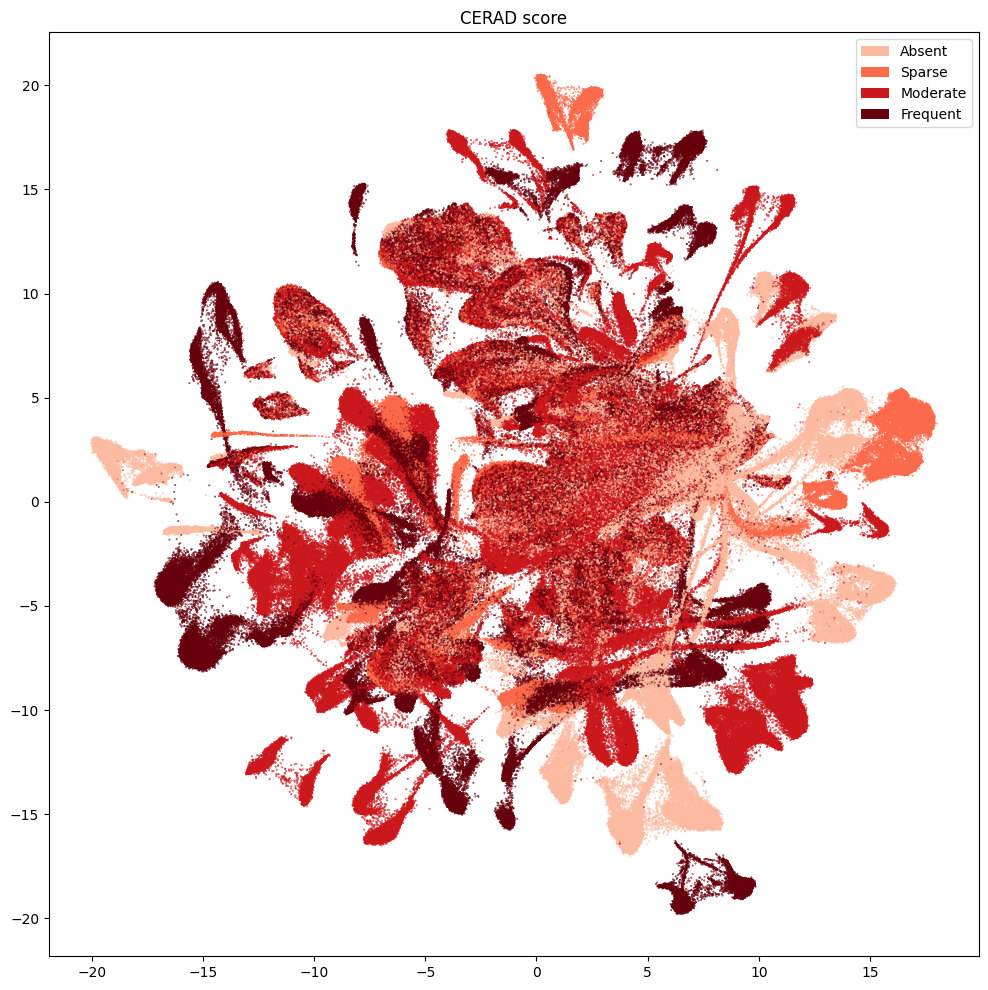

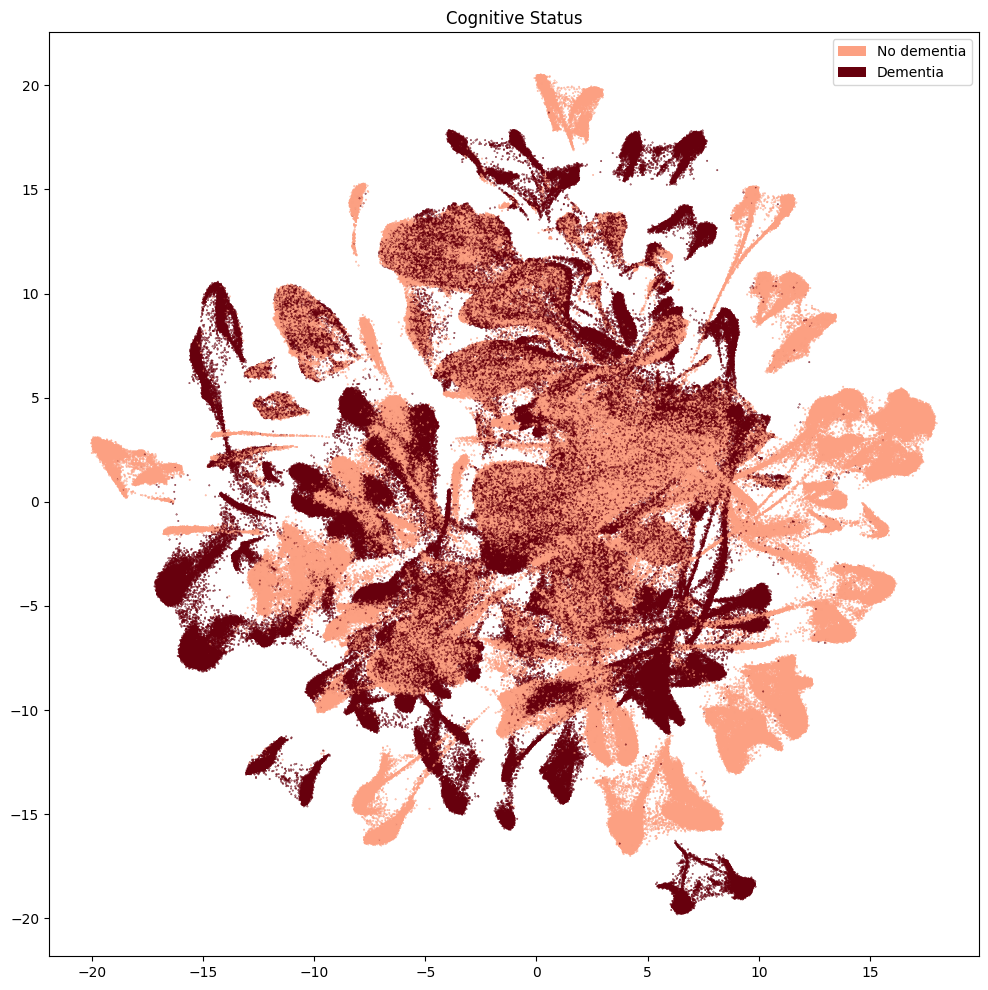

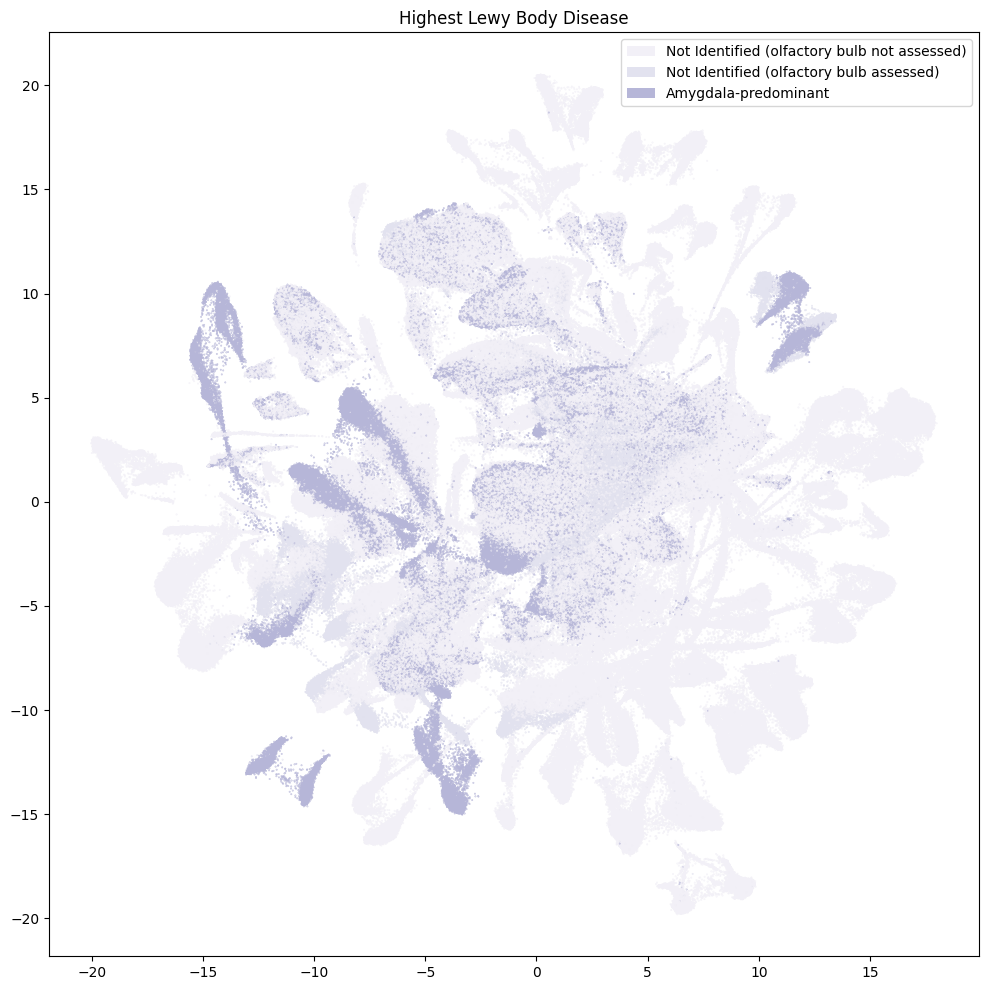

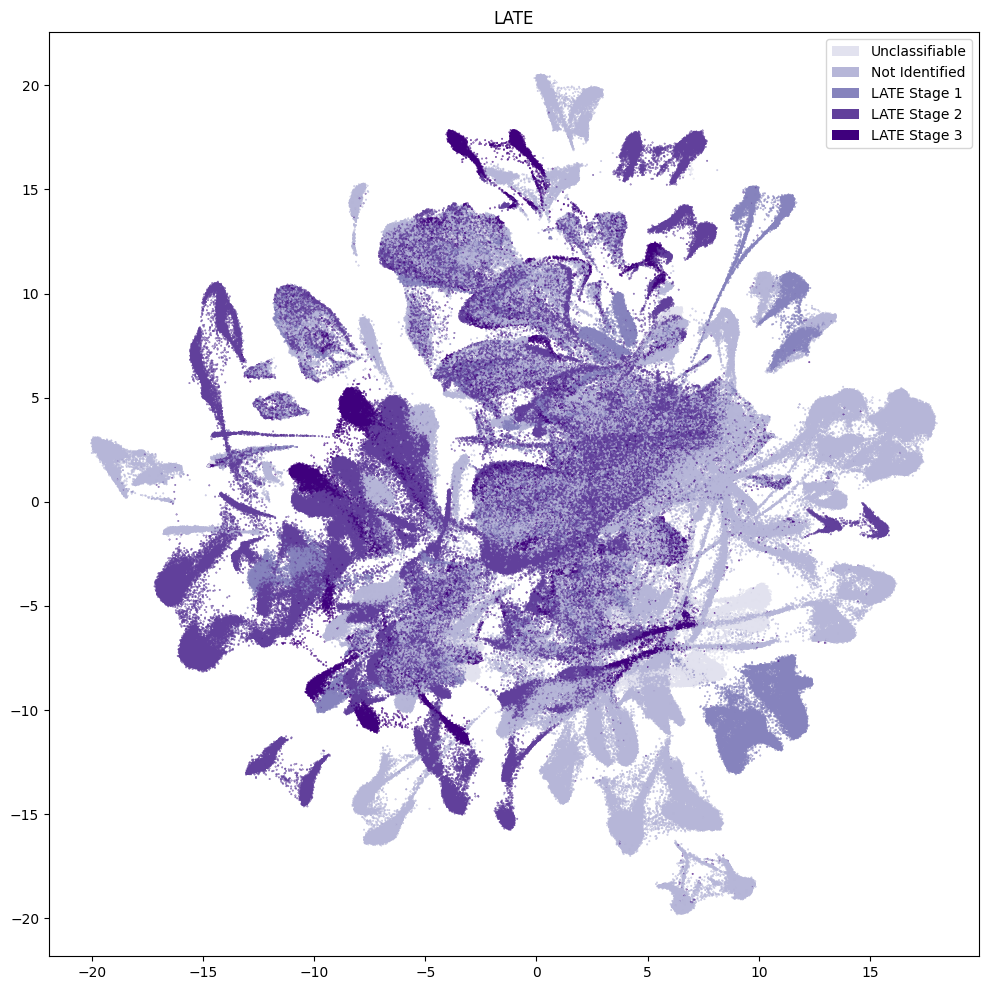

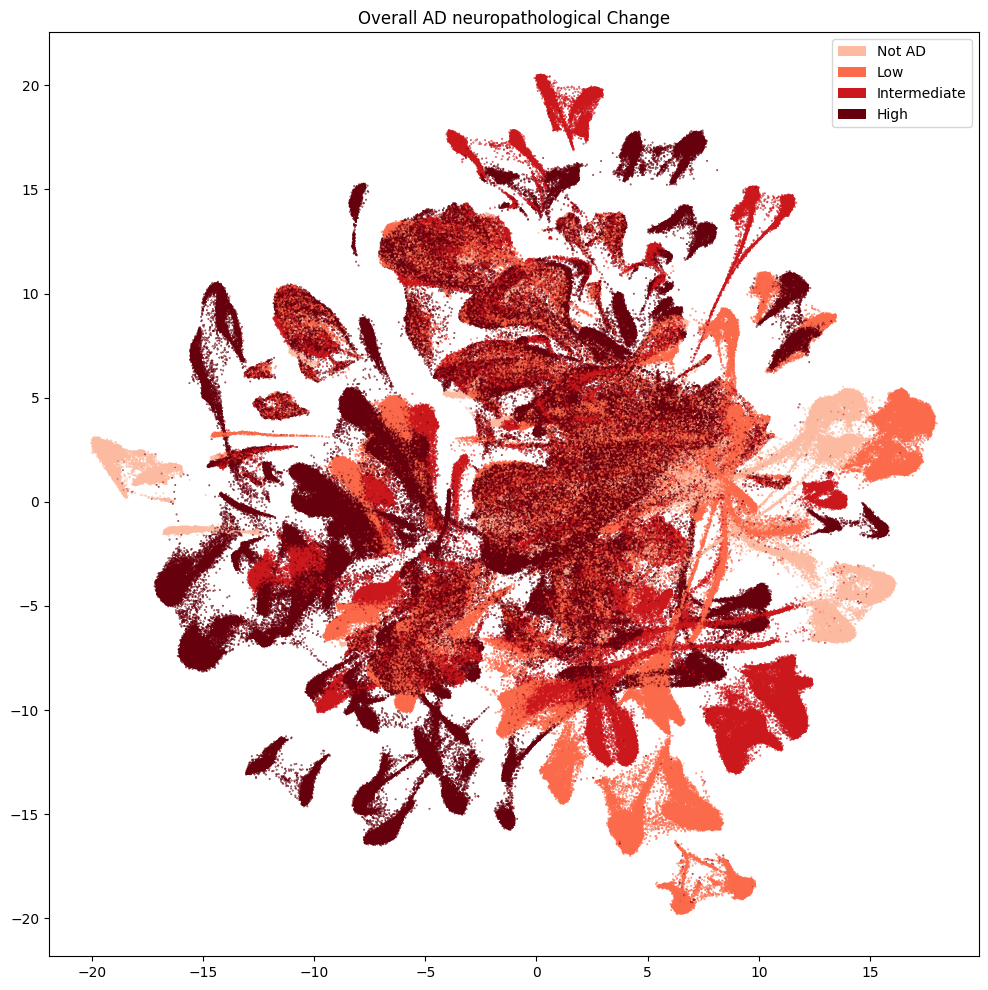

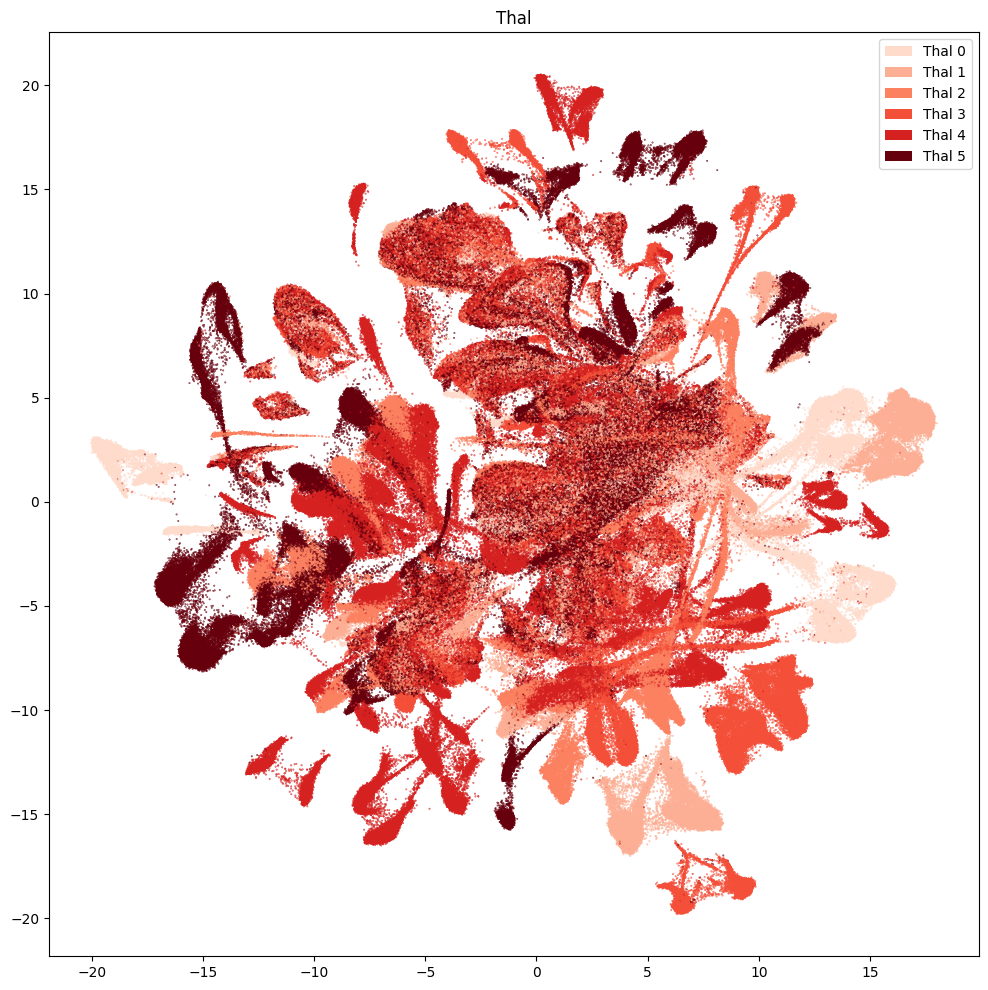

In [25]:
for disease_value in value_sets[value_sets['table'] == 'disease']['field'].unique():
    if disease_value == 'Severely Affected Donor':
        continue
    fig, ax = plot_umap(
        cell_extended['x'],
        cell_extended['y'],
        cc=cell_extended[f'{disease_value}_color'],
        labels=cell_extended[f'{disease_value}'],
        term_orders=cell_extended[f'{disease_value}_order'],
        fig_width=12,
        fig_height=12
    )
    res = ax.set_title(f"{disease_value}")
    plt.show()

Finally, we'll plot the pseudo-progression scores (CPS) for these data.

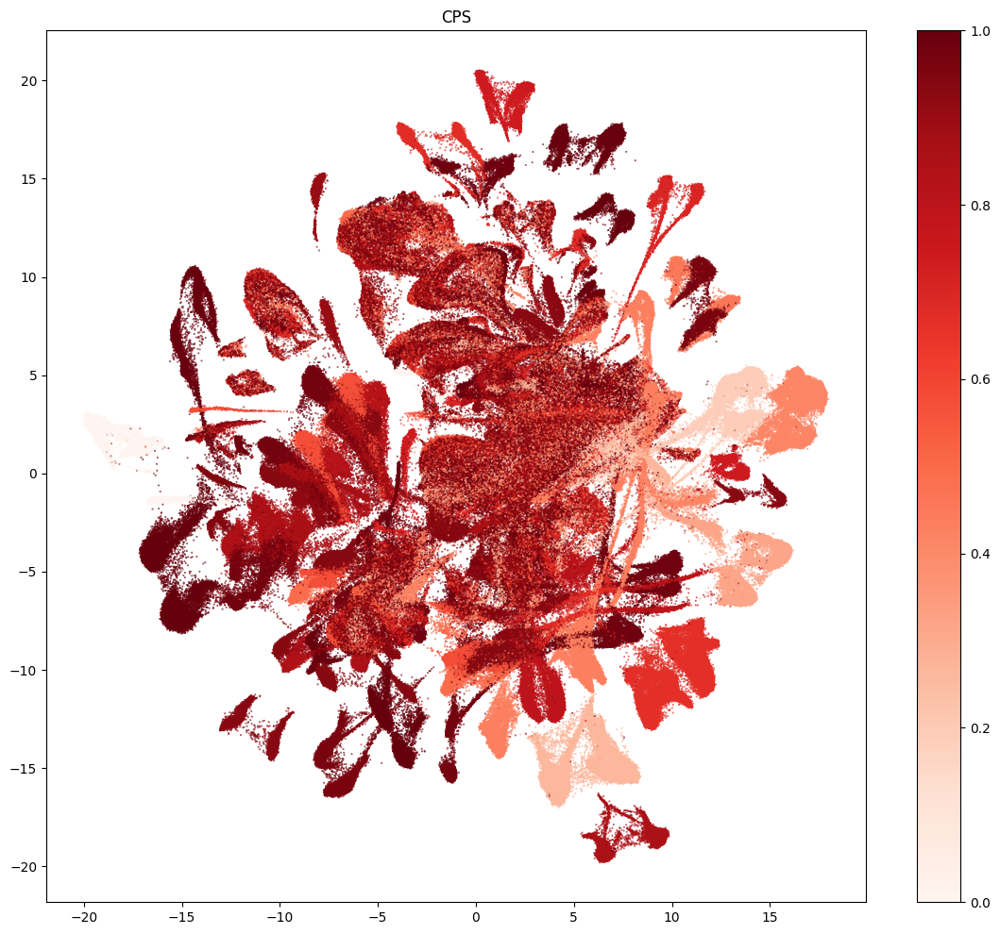

In [26]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    val=cell_extended['CPS'],
    cmap=plt.cm.Reds,
    fig_width=14,
    fig_height=12,
    colorbar=True,
)
res = ax.set_title("CPS")
plt.show()

## Taxonomy Information

The final set of metadata we load into our extended cell metadata file maps the cells into their assigned cluster in the taxonomy. We additionally load metadata for the clusters and compute useful information, such as the number of cells in each taxon at each level of the taxonomy. In this notebook `cluster` refers to the leaf node of the taxonomy as is the case throughout `abc_atlas_access`. In this taxonomy, the highest granularity cell type is called ‘supertype’; therefore, when you see the term ‘cluster’ below it refers to the leaf node of the taxonomy aka, the supertypes.

First, we load information associated with the lowest level in the taxonomy. This includes a useful alias value for each cluster as well as the number of cells in each supertype.

In [27]:
cluster = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-taxonomy',
    file_name='cluster',
    dtype={'number_of_cells': 'Int64'}
).rename(columns={'label': 'cluster_annotation_term_label'}).set_index('cluster_annotation_term_label')
cluster.head()

cluster.csv: 100%|██████████| 1.80k/1.80k [00:00<00:00, 11.8kMB/s]


,cluster_alias,number_of_cells
cluster_annotation_term_label,,
CS20260701_SUPR_01,1,159711
CS20260701_SUPR_02,2,47339
CS20260701_SUPR_03,3,22901
CS20260701_SUPR_04,4,168087
CS20260701_SUPR_05,5,5031


Next, we load the table that describes the levels in the taxonomy from neighborhood at the highest to supertype at the lowest level.

In [28]:
cluster_annotation_term_set = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-taxonomy',
    file_name='cluster_annotation_term_set'
).rename(columns={'label': 'cluster_annotation_term_label'})
cluster_annotation_term_set

cluster_annotation_term_set.csv: 100%|██████████| 222/222 [00:00<00:00, 3.54kMB/s]


,name,cluster_annotation_term_label,description,order,parent_term_set_label
0,Neighborhood,CCN20260701_LEVEL_0,Neighborhood,0,NaN
1,Subclass,CCN20260701_LEVEL_1,Subclass,1,CCN20260701_LEVEL_0
2,Supertype,CCN20260701_LEVEL_2,Supertype,2,CCN20260701_LEVEL_1


For the supertypes, we load information on the annotations for each supertype. This also includes the term order and color information which we will use to plot later.

In [29]:
cluster_annotation_term = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-taxonomy',
    file_name='cluster_annotation_term',
).rename(columns={'label': 'cluster_annotation_term_label'}).set_index('cluster_annotation_term_label')
cluster_annotation_term

cluster_annotation_term.csv: 100%|██████████| 10.8k/10.8k [00:00<00:00, 110kMB/s]


,name,cluster_annotation_term_set_label,cluster_annotation_term_set_name,color_hex_triplet,term_order,term_set_order,parent_term_label,parent_term_name,parent_term_set_label,CCN20230508_label,CCN20250428_label
cluster_annotation_term_label,,,,,,,,,,,
CS20260701_NEIG_04,Astro-Epen,CCN20260701_LEVEL_0,Neighborhood,#9A7345,4,0,NaN,NaN,NaN,NaN,NaN
CS20260701_NEIG_03,CGE,CCN20260701_LEVEL_0,Neighborhood,#C355B0,3,0,NaN,NaN,NaN,NaN,NaN
CS20260701_NEIG_05,Immune,CCN20260701_LEVEL_0,Neighborhood,#6BBC6B,5,0,NaN,NaN,NaN,NaN,NaN
CS20260701_NEIG_01,LGE,CCN20260701_LEVEL_0,Neighborhood,#5B47C1,1,0,NaN,NaN,NaN,NaN,NaN
CS20260701_NEIG_08,LSX,CCN20260701_LEVEL_0,Neighborhood,#B1B1B1,8,0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
CS20260701_SUPR_30,Vip_23,CCN20260701_LEVEL_2,Supertype,#5A3D67,30,2,NaN,Vip,CCN20260701_LEVEL_1,CS20230508_SUPT_0034,NaN
CS20260701_SUPR_31,Vip_4,CCN20260701_LEVEL_2,Supertype,#D0AEDC,31,2,NaN,Vip,CCN20260701_LEVEL_1,CS20230508_SUPT_0022,NaN
CS20260701_SUPR_32,Vip_5,CCN20260701_LEVEL_2,Supertype,#C7A5D3,32,2,NaN,Vip,CCN20260701_LEVEL_1,CS20230508_SUPT_0023,NaN


Finally, we load the cluster to cluster annotation membership table. Each row in this table is a mapping between the subclusters and every level of the taxonomy it belongs to, including itself. We'll use this table in a `groupby` to allow us to count up the number of clusters at each taxonomy level and sum the number of cells in each taxon in the taxonomy a all levels.

In [30]:
cluster_to_cluster_annotation_membership = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-taxonomy',
    file_name='cluster_to_cluster_annotation_membership'
).set_index('cluster_annotation_term_label')
membership_with_cluster_info = cluster_to_cluster_annotation_membership.join(
    cluster.reset_index().set_index('cluster_alias')[['number_of_cells']],
    on='cluster_alias'
)
membership_with_cluster_info = membership_with_cluster_info.join(cluster_annotation_term, rsuffix='_anno_term').reset_index()
membership_groupby = membership_with_cluster_info.groupby(
    ['cluster_alias', 'cluster_annotation_term_set_name']
)
membership_with_cluster_info.head()

cluster_to_cluster_annotation_membership.csv: 100%|██████████| 12.4k/12.4k [00:00<00:00, 172kMB/s]


,cluster_annotation_term_label,cluster_annotation_term_set_name,cluster_annotation_term_name,cluster_alias,cluster_annotation_term_set_label,number_of_cells,name,cluster_annotation_term_set_label_anno_term,cluster_annotation_term_set_name_anno_term,color_hex_triplet,term_order,term_set_order,parent_term_label,parent_term_name,parent_term_set_label,CCN20230508_label,CCN20250428_label
0,CS20260701_NEIG_04,Neighborhood,Astro-Epen,35,CCN20260701_LEVEL_0,11849,Astro-Epen,CCN20260701_LEVEL_0,Neighborhood,#9A7345,4,0,NaN,NaN,NaN,NaN,NaN
1,CS20260701_NEIG_04,Neighborhood,Astro-Epen,36,CCN20260701_LEVEL_0,43115,Astro-Epen,CCN20260701_LEVEL_0,Neighborhood,#9A7345,4,0,NaN,NaN,NaN,NaN,NaN
2,CS20260701_NEIG_04,Neighborhood,Astro-Epen,37,CCN20260701_LEVEL_0,7424,Astro-Epen,CCN20260701_LEVEL_0,Neighborhood,#9A7345,4,0,NaN,NaN,NaN,NaN,NaN
3,CS20260701_NEIG_04,Neighborhood,Astro-Epen,38,CCN20260701_LEVEL_0,660,Astro-Epen,CCN20260701_LEVEL_0,Neighborhood,#9A7345,4,0,NaN,NaN,NaN,NaN,NaN
4,CS20260701_NEIG_04,Neighborhood,Astro-Epen,39,CCN20260701_LEVEL_0,2203,Astro-Epen,CCN20260701_LEVEL_0,Neighborhood,#9A7345,4,0,NaN,NaN,NaN,NaN,NaN


From the membership table, we create three tables via a `groupby`. First the name of each cluster and its parents.

In [31]:
# term_sets = abc_cache.get_metadata_dataframe(directory='WHB-taxonomy', file_name='cluster_annotation_term_set').set_index('label')
cluster_details = membership_groupby['cluster_annotation_term_name'].first().unstack()
cluster_details = cluster_details[cluster_annotation_term_set['name']] # order columns
cluster_details.fillna('Other', inplace=True)
cluster_details.head()

cluster_annotation_term_set_name,Neighborhood,Subclass,Supertype
cluster_alias,,,
1,LGE,STR D1 MSN,STRd D1 Matrix MSN
2,LGE,STR D1 MSN,STRd D1 Striosome MSN
3,LGE,STR D1 MSN,STRv D1 MSN
4,LGE,STR D2 MSN,STRd D2 Matrix MSN
5,LGE,STR D2 MSN,STRd D2 StrioMat Hybrid MSN


Next the plotting order of each of the taxons and their parents.

In [32]:
cluster_order = membership_groupby['term_order'].first().unstack()
cluster_order.rename(
    columns={'Neighborhood': 'Neighborhood_order',
             'Subclass': 'Subclass_order',
             'Supertype': 'Supertype_order'},
    inplace=True
)
cluster_order.head()

cluster_annotation_term_set_name,Neighborhood_order,Subclass_order,Supertype_order
cluster_alias,,,
1,1,1,1
2,1,1,2
3,1,1,3
4,1,2,4
5,1,2,5


Finally, the colors we will use to plot for each of the unique taxons at all levels.

In [33]:
cluster_colors = membership_groupby['color_hex_triplet'].first().unstack()
cluster_colors = cluster_colors[cluster_annotation_term_set['name']]
cluster_colors.head()

cluster_annotation_term_set_name,Neighborhood,Subclass,Supertype
cluster_alias,,,
1,#5B47C1,#1655f2,#1f77b4
2,#5B47C1,#1655f2,#d62728
3,#5B47C1,#1655f2,#339933
4,#5B47C1,#253c8c,#aec7e8
5,#5B47C1,#253c8c,#5713c3


Next, we bring it all together by loading the mapping of cells to supertype and join into our final metadata table.

In [34]:
cell_to_cluster_membership = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-taxonomy',
    file_name='cell_to_cluster_membership',
).set_index('cell_label')
cell_to_cluster_membership.head()

cell_to_cluster_membership.csv: 100%|██████████| 42.1M/42.1M [00:01<00:00, 26.1MMB/s]  


,cluster_alias,label
cell_label,,
AAACCCAAGAATCTAG-1336_B04,4,CS20260701_SUPR_04
AAACCCAAGCACAAAT-1336_B04,1,CS20260701_SUPR_01
AAACCCAAGGGACTGT-1336_B04,63,CS20260701_SUPR_63
AAACCCACAATTTCCT-1336_B04,44,CS20260701_SUPR_44
AAACCCACAGCAATTC-1336_B04,60,CS20260701_SUPR_60


We merge this table with information from our taxons.

In [35]:
cell_extended = cell_extended.join(cell_to_cluster_membership, rsuffix='_cell_to_cluster_membership', how='inner')
cell_extended = cell_extended.join(cluster_details, on='cluster_alias')
cell_extended = cell_extended.join(cluster_colors, on='cluster_alias', rsuffix='_color')
cell_extended = cell_extended.join(cluster_order, on='cluster_alias', rsuffix='_order')

del cell_to_cluster_membership

cell_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,alignment_job_id,doublet_score,umi_count,Used in analysis,donor_label,exp_component_name,feature_matrix_label,...,label,Neighborhood,Subclass,Supertype,Neighborhood_color,Subclass_color,Supertype_color,Neighborhood_order,Subclass_order,Supertype_order
cell_label,,,,,,,,,,,,,,,,,,,,,
AGCTTCCGTGCCGTTG-1257_A01,AGCTTCCGTGCCGTTG,1257_A01,L8HX_220519_03_D02,1181938671,0.02,21454.0,True,H20.33.027,AGCTTCCGTGCCGTTG-L8HX_220519_03_D02-1181938671,CaH-10X,...,CS20260701_SUPR_04,LGE,STR D2 MSN,STRd D2 Matrix MSN,#5B47C1,#253c8c,#aec7e8,1,2,4
CTGTGAAGTCTTTCAT-1265_A04,CTGTGAAGTCTTTCAT,1265_A04,L8HX_220526_02_B05,1184843179,0.02,45004.0,True,H20.33.040,CTGTGAAGTCTTTCAT-L8HX_220526_02_B05-1184843179,CaH-10X,...,CS20260701_SUPR_01,LGE,STR D1 MSN,STRd D1 Matrix MSN,#5B47C1,#1655f2,#1f77b4,1,1,1
TTTCAGTCAAGAGCTG-1225_B02,TTTCAGTCAAGAGCTG,1225_B02,L8HX_220428_03_C12,1176659186,0.07,43043.0,True,H21.33.032,TTTCAGTCAAGAGCTG-L8HX_220428_03_C12-1176659186,CaH-10X,...,CS20260701_SUPR_01,LGE,STR D1 MSN,STRd D1 Matrix MSN,#5B47C1,#1655f2,#1f77b4,1,1,1
AGGGCTCTCGCACGAC-1212_C01,AGGGCTCTCGCACGAC,1212_C01,L8HX_220421_03_A12,1174070526,0.51,51351.0,False,H20.33.025,AGGGCTCTCGCACGAC-L8HX_220421_03_A12-1174070526,CaH-10X,...,CS20260701_SUPR_60,Vascular,Endothelial,Endo_2,#BF6958,#8D6C62,#B09A93,7,14,60
AAGGTAAGTTGGAGGT-1212_A01,AAGGTAAGTTGGAGGT,1212_A01,L8HX_220421_03_F12,1174070517,0.06,18140.0,True,H20.33.046,AAGGTAAGTTGGAGGT-L8HX_220421_03_F12-1174070517,CaH-10X,...,CS20260701_SUPR_02,LGE,STR D1 MSN,STRd D1 Striosome MSN,#5B47C1,#1655f2,#d62728,1,1,2


In [36]:
print_column_info(cell_extended)

Number of unique cell_barcode = 804174 
Number of unique barcoded_cell_sample_label = 64 
Number of unique library_label = 64 
Number of unique alignment_job_id = 66 
Number of unique doublet_score = 876 
Number of unique umi_count = 111595 
Number of unique Used in analysis = 2 [False, True]
Number of unique donor_label = 41 
Number of unique exp_component_name = 886037 
Number of unique feature_matrix_label = 1 ['CaH-10X']
Number of unique dataset_label = 1 ['SEA-AD-CaH-10X']
Number of unique donor_species = 1 ['NCBITaxon:9606']
Number of unique species_scientific_name = 1 ['Homo sapiens']
Number of unique species_genus = 1 ['Human']
Number of unique donor_sex = 2 ['Female', 'Male']
Number of unique donor_age = 23 ['68 yrs', '69 yrs', '70 yrs', '72 yrs', '75 yrs', '78 yrs', '80 yrs', '81 yrs', '82 yrs', '83 yrs', '84 yrs', '87 yrs', '88 yrs', '89 yrs', '90 yrs', '91 yrs', '92 yrs', '93 yrs', '94 yrs', '96 yrs', '97 yrs', '98 yrs', '99 yrs']
Number of unique donor_age_value = 23 [68, 

#### Plotting the taxonomy

Now that we have our cells with associated taxonomy information, we'll plot them into the UMAP we showed previously.

Below we plot the taxonomy mapping of the cells for each level in the taxonomy.

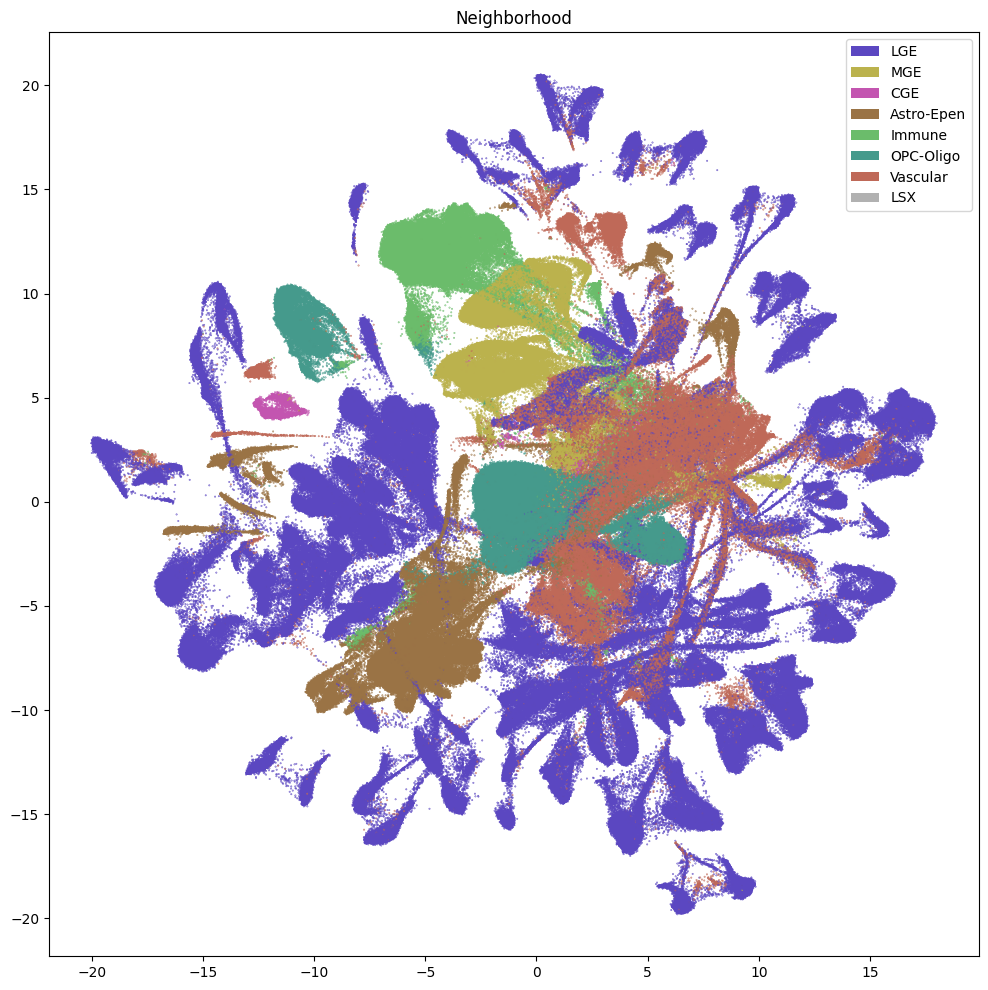

In [37]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['Neighborhood_color'],
    labels=cell_extended['Neighborhood'],
    term_orders=cell_extended['Neighborhood_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Neighborhood")
plt.show()

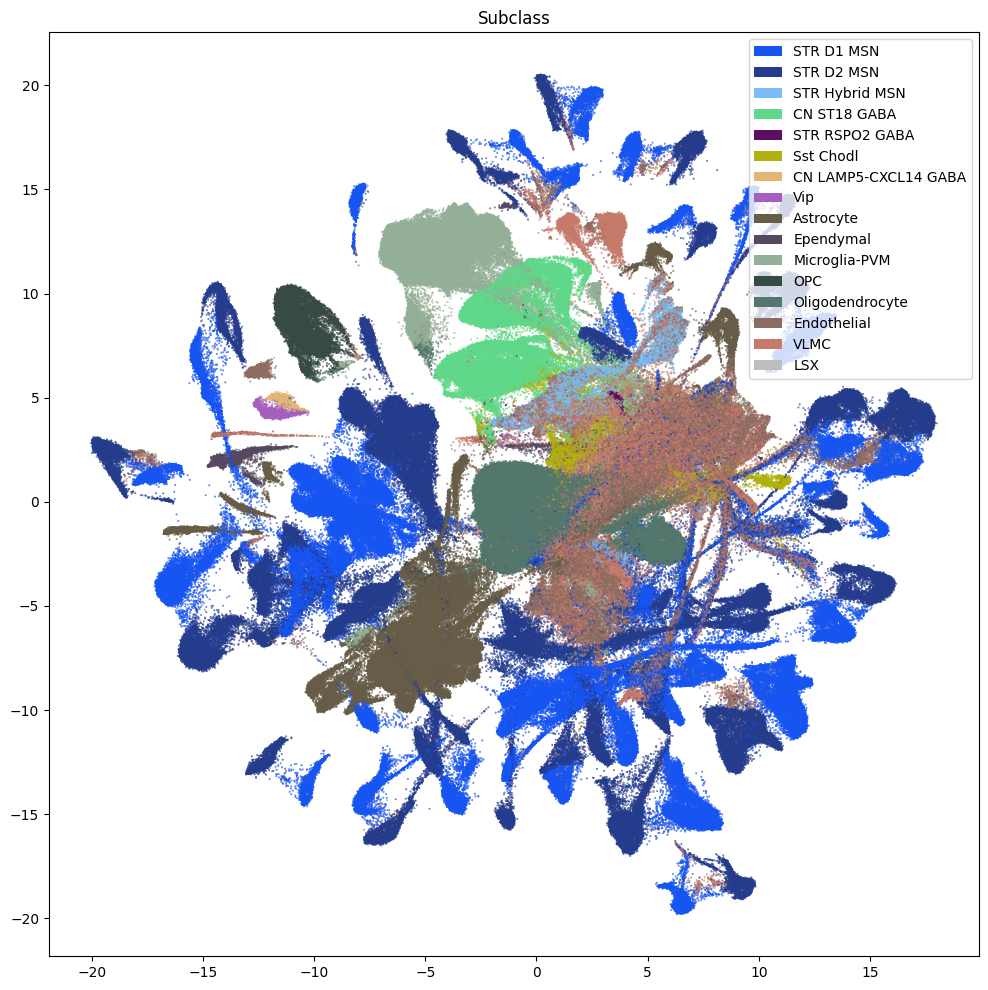

In [38]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['Subclass_color'],
    labels=cell_extended['Subclass'],
    term_orders=cell_extended['Subclass_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Subclass")
plt.show()

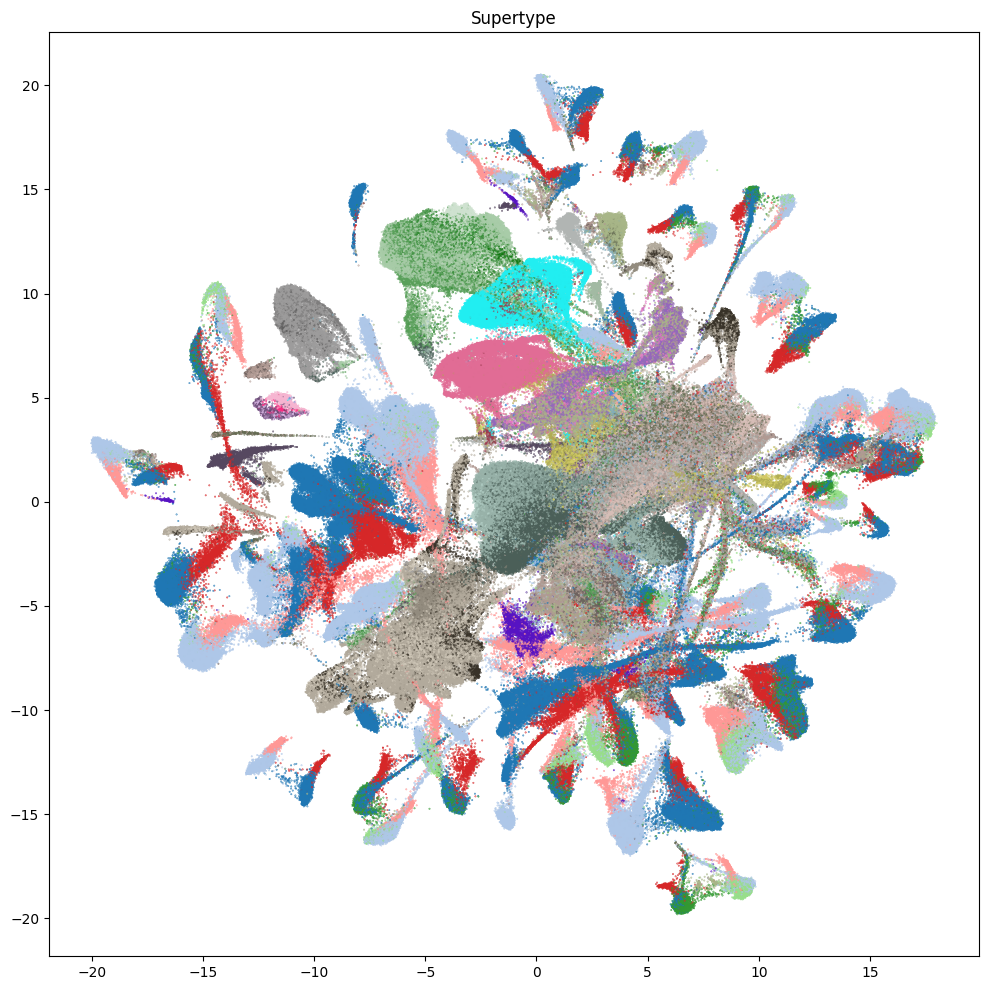

In [39]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['Supertype_color'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Supertype")
plt.show()

### Aggregating supertype and cells counts.

Let's investigate the taxonomy information a bit more. In this section, we'll create bar plots showing the number of supertype and cells at each level in the taxonomy.

First, we need to compute the number of supertype that are in each of the cell type taxons above it. This is accomplished by a simple groupby in Pandas.

In [40]:
term_cluster_count = membership_with_cluster_info.reset_index().groupby(
        ['cluster_annotation_term_label']
    )[['cluster_alias']].count()
term_cluster_count.columns = ['number_of_supertypes']
term_cluster_count.head()

,number_of_supertypes
cluster_annotation_term_label,
CS20260701_NEIG_01,9
CS20260701_NEIG_02,7
CS20260701_NEIG_03,18
CS20260701_NEIG_04,7
CS20260701_NEIG_05,8


In [41]:
term_cell_count = membership_with_cluster_info.reset_index().groupby(
    ['cluster_annotation_term_label']
)[['number_of_cells']].sum()
term_cell_count.head()

,number_of_cells
cluster_annotation_term_label,
CS20260701_NEIG_01,477670
CS20260701_NEIG_02,55241
CS20260701_NEIG_03,4577
CS20260701_NEIG_04,76936
CS20260701_NEIG_05,46651


In [42]:
# Join counts with the term dataframe
term_with_counts = cluster_annotation_term.join(term_cluster_count)
term_with_counts = term_with_counts.join(term_cell_count)
term_with_counts.head()

,name,cluster_annotation_term_set_label,cluster_annotation_term_set_name,color_hex_triplet,term_order,term_set_order,parent_term_label,parent_term_name,parent_term_set_label,CCN20230508_label,CCN20250428_label,number_of_supertypes,number_of_cells
cluster_annotation_term_label,,,,,,,,,,,,,
CS20260701_NEIG_04,Astro-Epen,CCN20260701_LEVEL_0,Neighborhood,#9A7345,4,0,NaN,NaN,NaN,NaN,NaN,7,76936
CS20260701_NEIG_03,CGE,CCN20260701_LEVEL_0,Neighborhood,#C355B0,3,0,NaN,NaN,NaN,NaN,NaN,18,4577
CS20260701_NEIG_05,Immune,CCN20260701_LEVEL_0,Neighborhood,#6BBC6B,5,0,NaN,NaN,NaN,NaN,NaN,8,46651
CS20260701_NEIG_01,LGE,CCN20260701_LEVEL_0,Neighborhood,#5B47C1,1,0,NaN,NaN,NaN,NaN,NaN,9,477670
CS20260701_NEIG_08,LSX,CCN20260701_LEVEL_0,Neighborhood,#B1B1B1,8,0,NaN,NaN,NaN,NaN,NaN,1,162


Below we create a function to plot the supertype and cell counts in a bar graph, coloring by the associated taxon level.

In [43]:
def bar_plot_by_level_and_type(
        df: pd.DataFrame,
        level: str, fig_width:
        float = 8.5, fig_height:
        float = 4,
        cell_min: int = None,
        supertype_min: int = None
    ):
    """Plot the number of cells by the specified level.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame containing cluster annotation terms with counts.
    level : str
        The level of the taxonomy to plot (e.g., 'Neighborhood', 'Class', 'Subclass', 'Group', 'Cluster').
    fig_width : float, optional
        Width of the figure in inches. Default is 8.5.
    fig_height : float, optional
        Height of the figure in inches. Default is 4.
    """

    fig, ax = plt.subplots(1, 2)
    fig.set_size_inches(fig_width, fig_height)

    for idx, ctype in enumerate(['supertypes', 'cells']):

        pred = (df['cluster_annotation_term_set_name'] == level)
        sort_order = np.argsort(df[pred]['term_order'])
        names = df[pred]['name'].iloc[sort_order]
        counts = df[pred]['number_of_%s' % ctype].iloc[sort_order]
        colors = df[pred]['color_hex_triplet'].iloc[sort_order]
        
        ax[idx].barh(names, counts, color=colors)
        ax[idx].set_title('Number of %s by %s' % (ctype,level))
        ax[idx].set_xlabel('Number of %s' % ctype)
        if ctype == 'supertypes' and supertype_min is not None:
                ax[idx].set_xlim(left=supertype_min)
        if ctype == 'cells':
            if cell_min is not None:
                ax[idx].set_xlim(left=cell_min)
            ax[idx].set_xscale('log')
        
        if idx > 0:
            ax[idx].set_yticklabels([])

    return fig, ax

Now let's plot the counts the taxonomy levels neighborhood and subclass.

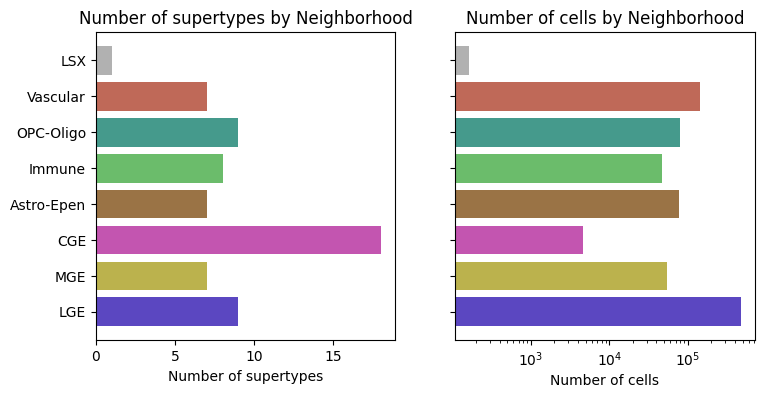

In [44]:
fig, ax = bar_plot_by_level_and_type(term_with_counts, 'Neighborhood')
plt.show()

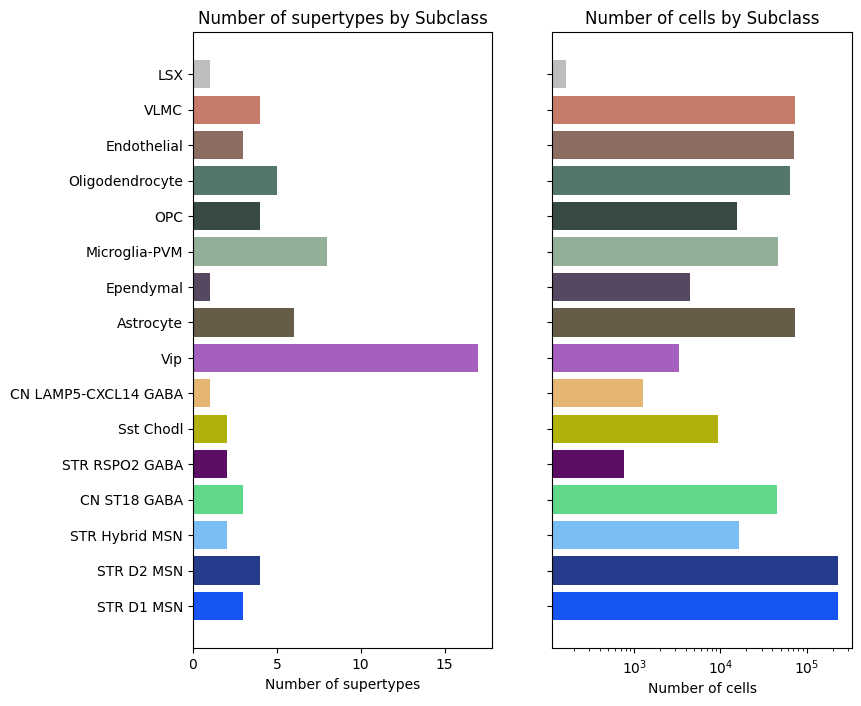

In [45]:
fig, ax = bar_plot_by_level_and_type(
    term_with_counts,
    'Subclass',
    fig_height=8
)
plt.show()

### Visualizing the SEA-AD CaH Taxonomy

Term sets: neighborhood, subclass, and supertype define the SEA-AD CaH taxonomy. We can visualize the taxonomy as a sunburst diagram that shows the single inheritance hierarchy through a series of rings, that are sliced for each annotation term. Each ring corresponds to a level in the hierarchy. We have ordered the rings so that the neighborhood level. Rings are divided based on their hierarchical relationship to the parent slice.

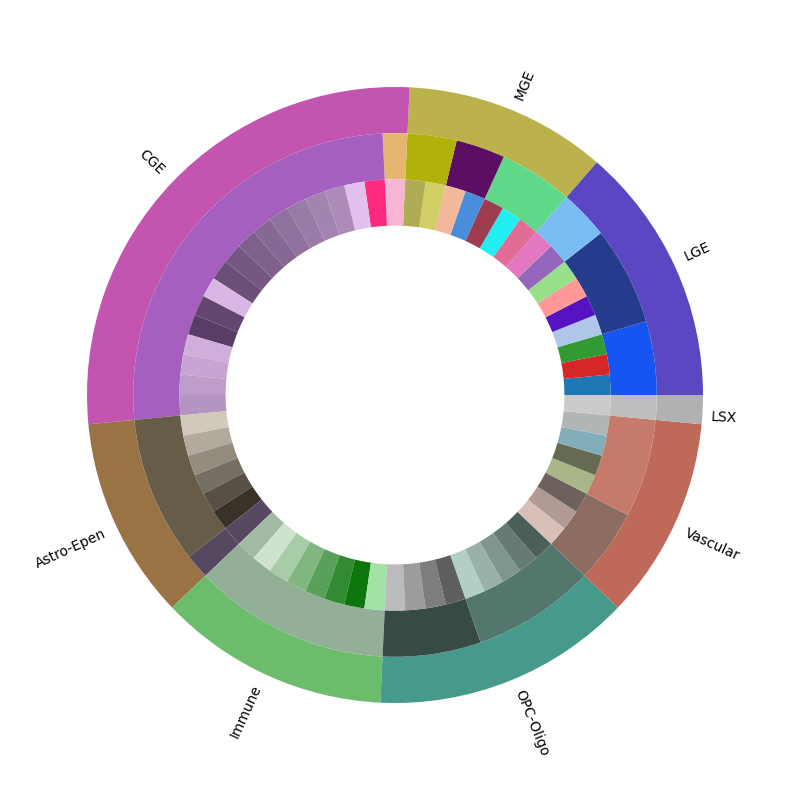

In [46]:
levels = ['Neighborhood', 'Subclass', 'Supertype']
df = {}

# Copy the term order of the parent into each of the level below it.
if term_with_counts.index.name != 'cluster_annotation_term_label':
    term_with_counts = term_with_counts.set_index('cluster_annotation_term_label')
term_with_counts['parent_order'] = ""
for idx, row in term_with_counts.iterrows():
    if pd.isna(row['parent_term_label']):
        continue
    term_with_counts.loc[idx, 'parent_order'] = term_with_counts.loc[row['parent_term_label']]['term_order']

term_with_counts = term_with_counts.reset_index()
for lvl in levels:
    pred = term_with_counts['cluster_annotation_term_set_name'] == lvl
    df[lvl] = term_with_counts[pred]
    df[lvl] = df[lvl].sort_values(['parent_order', 'term_order'])

fig, ax = plt.subplots()
fig.set_size_inches(10, 10)
size = 0.15

for i, lvl in enumerate(levels):
    
    if lvl == 'Neighborhood':
        ax.pie(df[lvl]['number_of_supertypes'],
               colors=df[lvl]['color_hex_triplet'],
               labels = df[lvl]['name'],
               rotatelabels=True,
               labeldistance=1.025,
               radius=1,
               wedgeprops=dict(width=size, edgecolor=None),
               startangle=0)
    else :
        ax.pie(df[lvl]['number_of_supertypes'],
               colors=df[lvl]['color_hex_triplet'],
               radius=1-i*size,
               wedgeprops=dict(width=size, edgecolor=None),
               startangle=0)
term_with_counts = term_with_counts.set_index('cluster_annotation_term_label')
plt.show()

In the next tutorial, we show how to access and use [SEA-AD CaH gene expression data](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_10X_RNASeq.html). You can also investigate the SEA-AD Multiregion data and taxonomy [here](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_multiregion_clustering_analysis_and_annotation.html).

Caudate spatial transcriptomic data is also available. You can investigate the assignment of the spatial data the SEA-AD CaH taxonomy [here](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cach_spatial_sections_and_taxonomy.html) or check out the gene expression [here](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_spatial_genes.html)